In [1]:
%cd /home/schirrmr/

%load_ext autoreload
%autoreload 2


import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'png'
matplotlib.rcParams['figure.figsize'] = (12.0, 4.0)
matplotlib.rcParams['font.size'] = 7

import matplotlib.lines as mlines
import seaborn
seaborn.set_style('darkgrid')
import logging
import importlib
importlib.reload(logging) # see https://stackoverflow.com/a/21475297/1469195
log = logging.getLogger()
log.setLevel('DEBUG')
import sys
logging.basicConfig(format='%(asctime)s %(levelname)s : %(message)s',
                     level=logging.DEBUG, stream=sys.stdout)
seaborn.set_palette('colorblind')

/home/schirrmr


In [2]:
import os
# add the repo itself
os.sys.path.insert(0, '/home/schirrmr/code/explaining/reversible//')

In [3]:
import pickle
import gzip
## from  http://deeplearning.net/data/mnist/mnist.pkl.gz I assume?
train, val, test = pickle.load(gzip.open('data/mnist/mnist.pkl.gz'), encoding='bytes')

X_train, y_train = train
X_val, y_val = val

X_train_topo = X_train.reshape(X_train.shape[0], 1, 28,28)
X_val_topo = X_val.reshape(X_val.shape[0], 1, 28,28)
from numpy.random import RandomState
#X_train_topo = np.pad(X_train_topo,((0,0),(0,0),(2,2),(2,2)), 'constant')
#X_val_topo = np.pad(X_val_topo,((0,0),(0,0),(2,2),(2,2)), 'constant')

In [5]:
from reversible.revnet import ReversibleBlockOld
import torch.nn as nn
def rev_block(n_chans, n_intermediate_chans):
    c = n_chans // 2
    n_i_c = n_intermediate_chans
    return ReversibleBlockOld(
        nn.Sequential(
            nn.Conv2d(c, n_i_c, (3,3), padding=1),
             nn.ReLU(),
             nn.Conv2d(n_i_c, c, (3,3), padding=1)),
        nn.Sequential(
            nn.Conv2d(c, n_i_c, (3,3), padding=1),
            nn.ReLU(),
            nn.Conv2d(n_i_c, c, (3,3), padding=1)))

def plot_sorted_examples(sorted_examples, cmap=cm.Greys_r, vmin=0,vmax=1):
    fig, axes = plt.subplots(2,10, figsize=(20,5))
    for ax, im in zip(axes.flatten(), sorted_examples.squeeze()):
        ax.imshow(im, vmin=vmin, vmax=vmax,cmap=cmap)
    return fig


In [6]:
mask = (y_train == 0) | (y_train == 1)
x = X_train_topo[mask]#[:1000]
y = y_train[mask]

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np
import copy
import math


In [8]:
from reversible.iterator import GenerativeIterator
from reversible.revnet import SubsampleSplitter, ViewAs
from reversible.util import set_random_seeds
from reversible.revnet import init_model_params
from torch.nn import ConstantPad2d
import torch as th
set_random_seeds(34093049, True)
feature_model = th.nn.Sequential(
    ConstantPad2d((2,2,2,2), 0),
    SubsampleSplitter(stride=2,checkerboard=True),
    rev_block(4,25),
    rev_block(4,25),
    SubsampleSplitter(stride=2,checkerboard=True),
    rev_block(16,50),
    rev_block(16,50),
    SubsampleSplitter(stride=2,checkerboard=True),
    rev_block(64,100),
    rev_block(64,100),
    SubsampleSplitter(stride=2,checkerboard=True),
    rev_block(256,200),
    rev_block(256,200),
    ViewAs((-1,256,2,2),(-1,256*2*2)),)

feature_model = feature_model.cuda()
init_model_params(feature_model, 1)

n_dims = 1024#int(np.prod(x.shape[1:])) 
n_clusters = int(len(np.unique(y)))
means_per_dim = th.autograd.Variable(th.zeros(n_clusters,n_dims).cuda() * 1.0, requires_grad=True)
stds_per_dim = th.autograd.Variable(th.ones(n_clusters,n_dims).cuda()  * 0.5, requires_grad=True)

In [9]:
from reversible.sliced import sample_directions
from reversible.util import np_to_var
directions_adv = th.cat([sample_directions(n_dims, True,True),
                         sample_directions(n_dims, True,True),
                         sample_directions(n_dims, True,True),
                        ],dim=0)
directions_adv = th.autograd.Variable(directions_adv.data, requires_grad=True)

inputs = np_to_var(x, dtype=np.float32).cuda()
targets = np_to_var(np.array([y == 0, y == 1]).T, dtype=np.float32).cuda()

from reversible.training import init_std_mean

init_std_mean(feature_model, inputs, targets, means_per_dim, stds_per_dim,
                 set_phase_interval=True)

optimizer = th.optim.Adam([
    {'params': list(feature_model.parameters()) + 
                       [means_per_dim, stds_per_dim],
    'lr': 0.001},],
{'params':[directions_adv,],
    'lr': -0.001},)

In [10]:
iterator = GenerativeIterator(upsample_supervised=True, batch_size=10610//16)


In [11]:
from reversible.sinkhorn import sinkhorn_to_gauss_dist
from reversible.sliced import sliced_from_samples_for_gauss_dist
from reversible.loss_util import hard_loss_per_cluster
from reversible.gaussian import get_gauss_samples
from reversible.revnet import invert
from reversible.ot_exact import ot_emd_loss

def reconstruct_loss(o,m,s):
    o = o[:len(o)//2]
    inputs = invert(feature_model, o)
    o_perturbed = o + get_gauss_samples(len(o), m.detach()*0, s.detach() * 0 + 0.01)
    inputs_perturbed = invert(feature_model, o_perturbed)
    diffs = inputs - inputs_perturbed
    loss = th.mean(diffs * diffs)
    loss += th.mean(th.abs(diffs))
    return loss

hard_loss_fn = lambda o,m,s : (ot_emd_loss(o,m,s) +
                              + 15 * sliced_from_samples_for_gauss_dist(o,m,s,n_dirs=4, adv_dirs=None)
                              + 15 * reconstruct_loss(o,m,s))
loss_fn = lambda o,d,t,m,s: hard_loss_per_cluster(o,t,m,s, hard_loss_fn)

loss_fn_adv = None # no adversarial training

In [12]:
def train_one_batch(iterator, feature_model, loss_fn, means_per_dim, stds_per_dim,
                   optimizer):
    b = iterator.get_batches(inputs, targets, None, None)
    b_X, b_y = b.__next__()
    outs = feature_model(b_X)
    loss = loss_fn(outs, None, b_y, means_per_dim, stds_per_dim)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss = var_to_np(loss)[0]
    return loss

In [13]:
n_batches_per_dataset = len([b for b in iterator.get_batches(inputs, targets, None, None)])
n_critic_updates = 0
n_updates_per_epoch = int(np.ceil(n_batches_per_dataset / (n_critic_updates + 1.0)))

,total_loss
0,12.509821


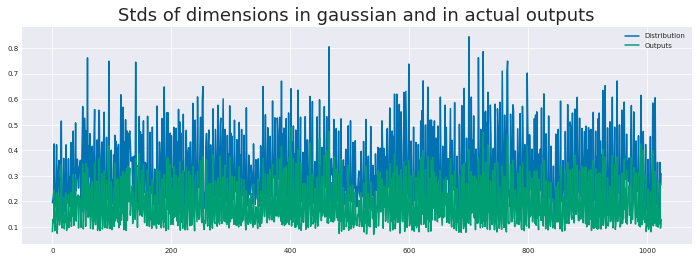

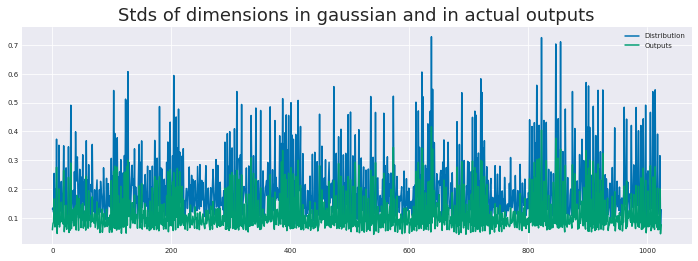

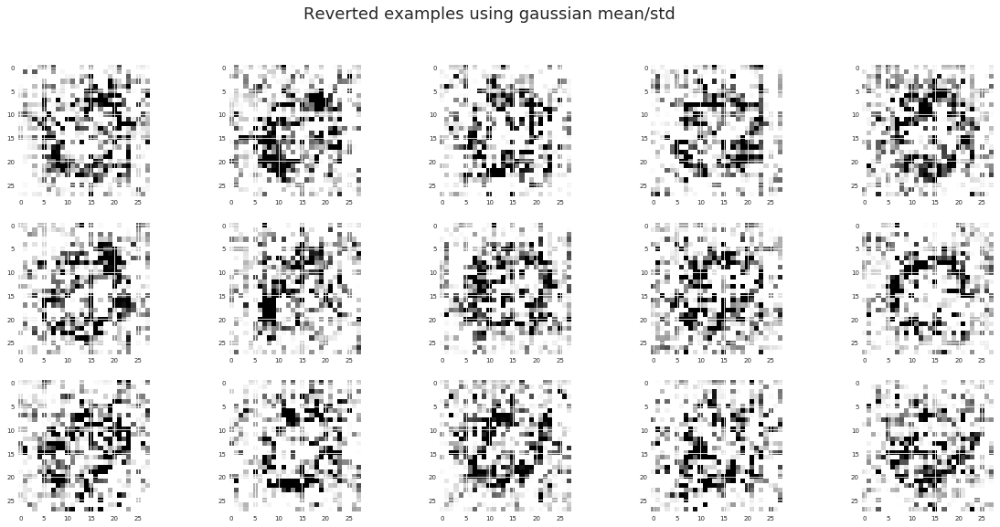

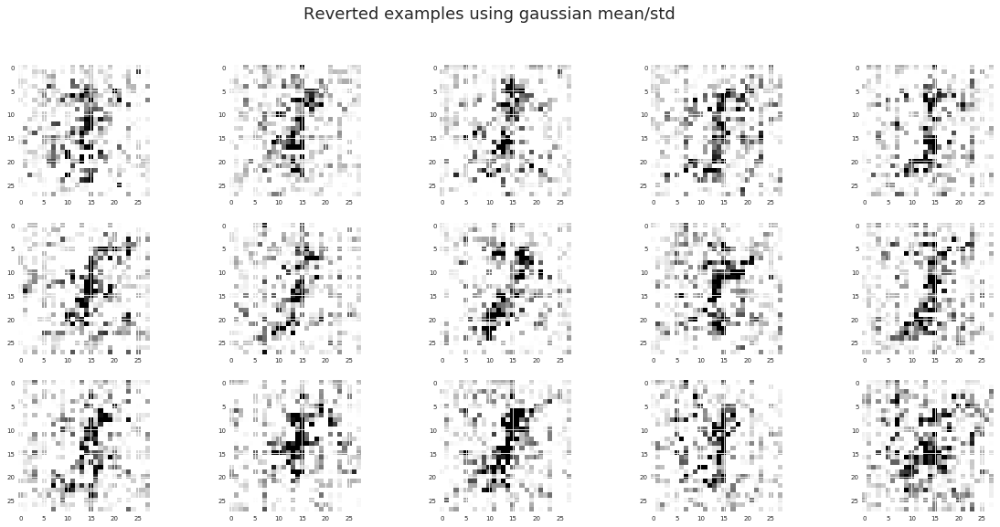

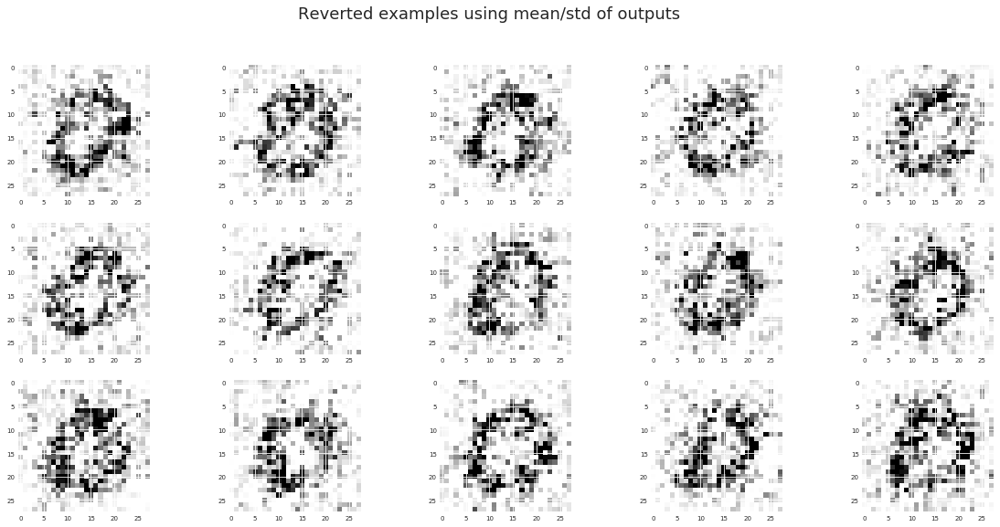

...

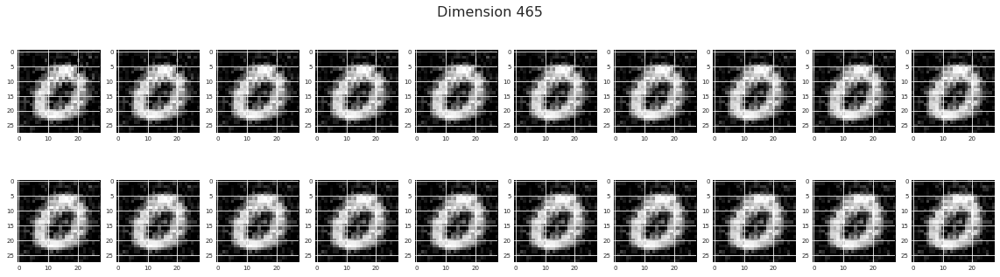

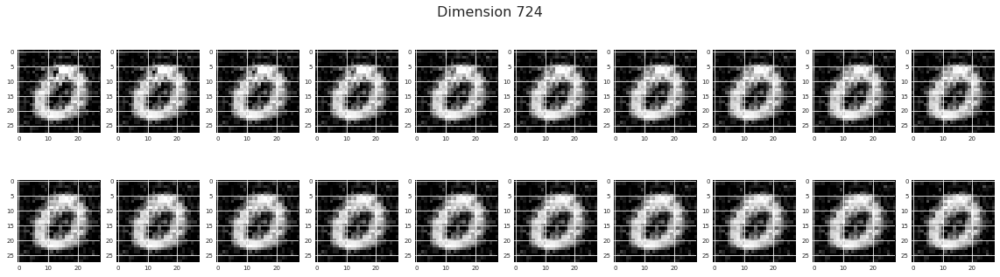

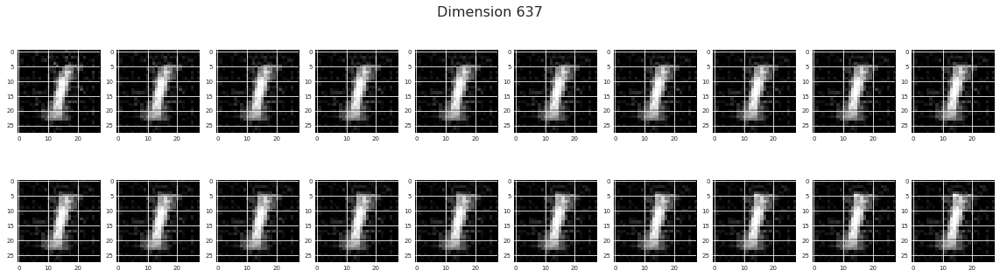

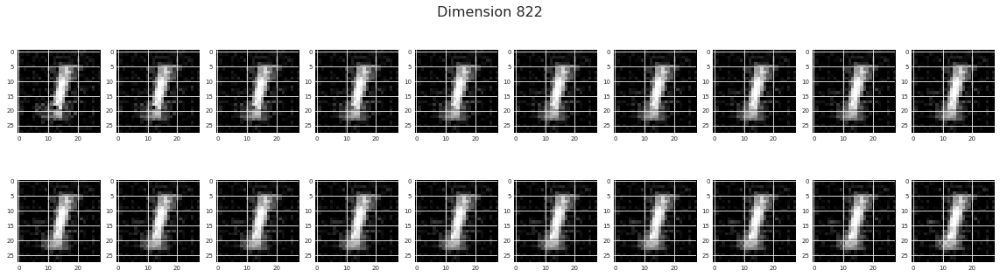

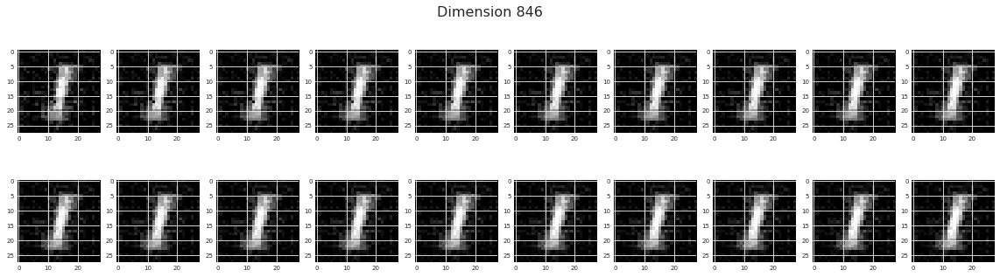

,total_loss
10,6.669772


,total_loss
20,3.813239


,total_loss
30,2.805782


,total_loss
40,2.425915


,total_loss
50,2.115139


,total_loss
60,1.889465


,total_loss
70,1.675709


,total_loss
80,1.58093


,total_loss
90,1.518592


,total_loss
100,1.45464


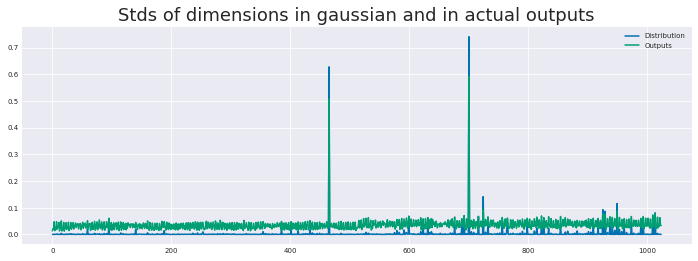

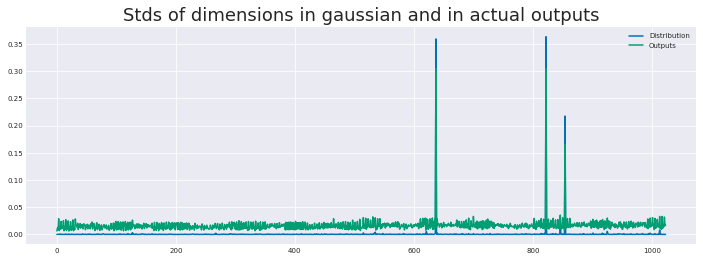

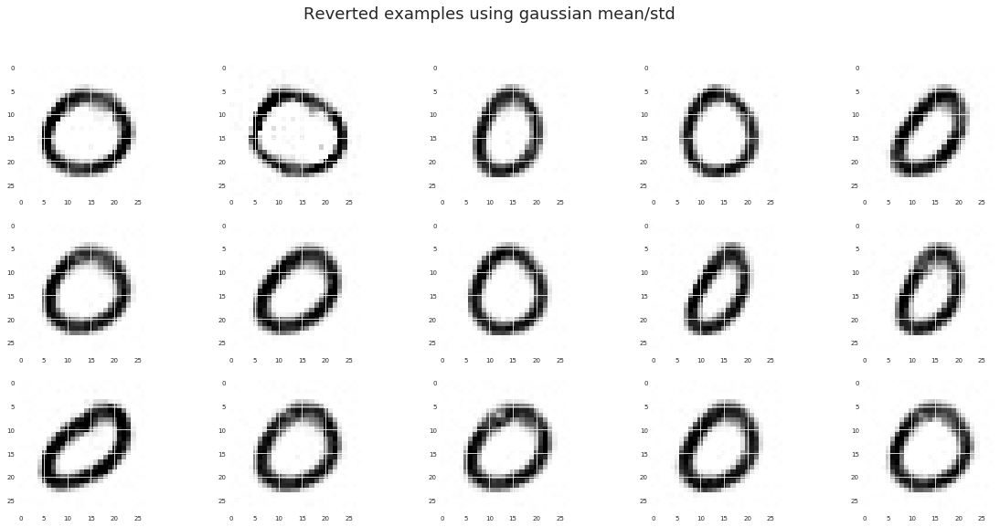

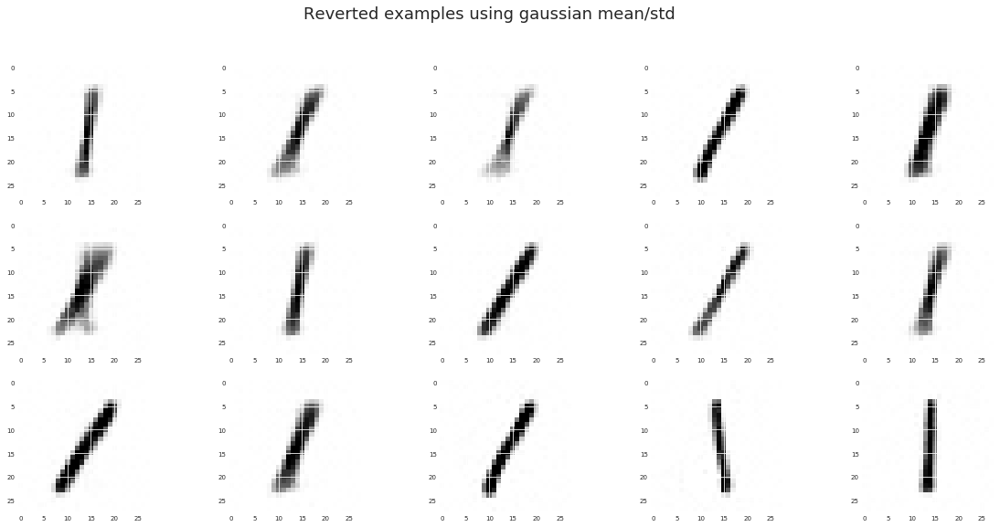

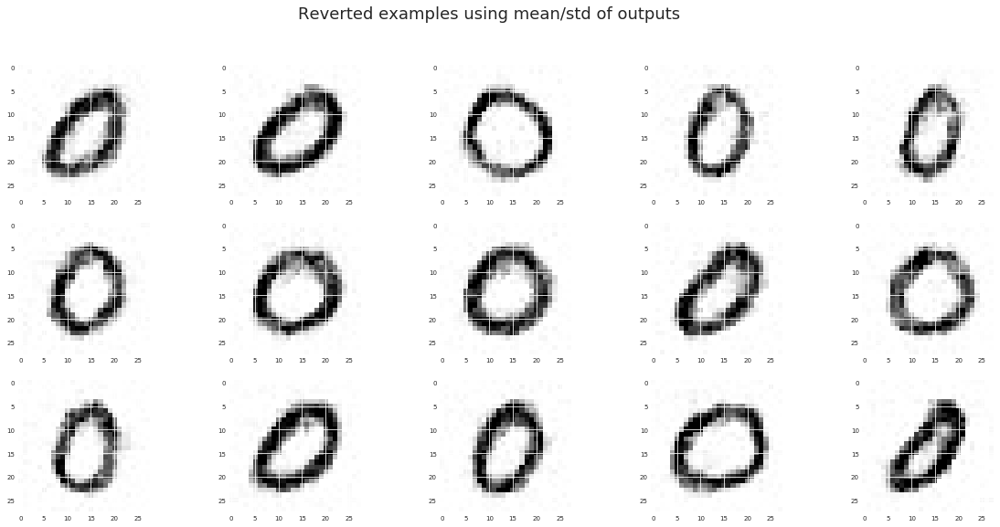

...

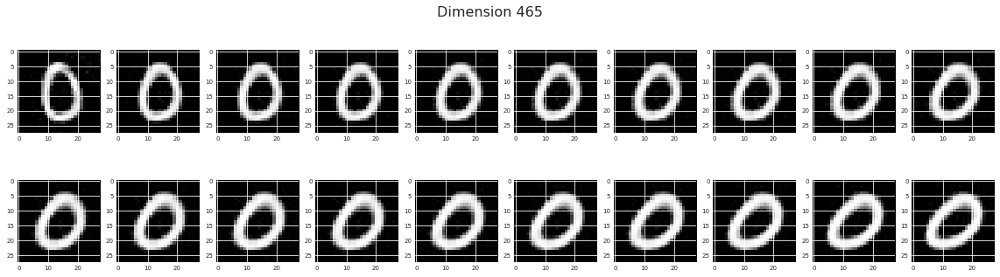

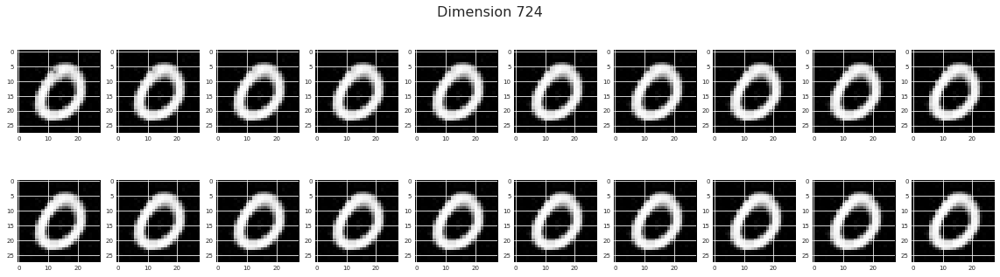

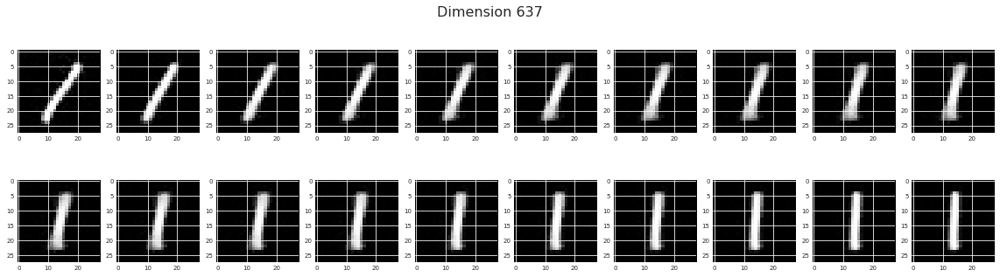

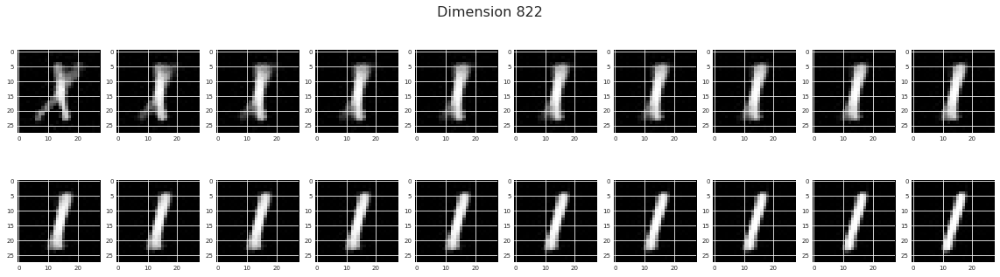

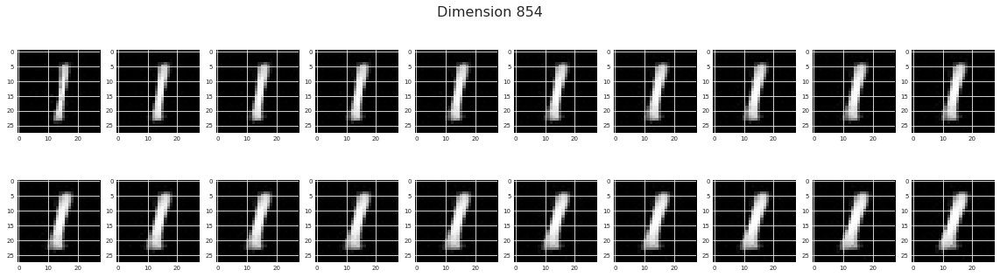

,total_loss
110,1.364923


,total_loss
120,1.295454


,total_loss
130,1.272393


,total_loss
140,1.21206


,total_loss
150,1.221905


,total_loss
160,1.156879


,total_loss
170,1.179147


,total_loss
180,1.127037


,total_loss
190,1.101685


,total_loss
200,1.067448


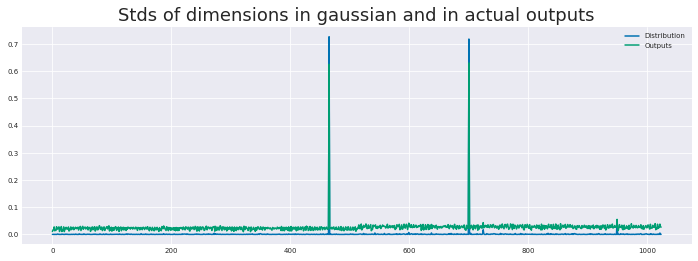

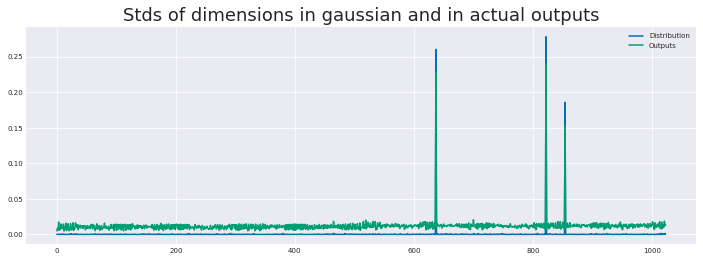

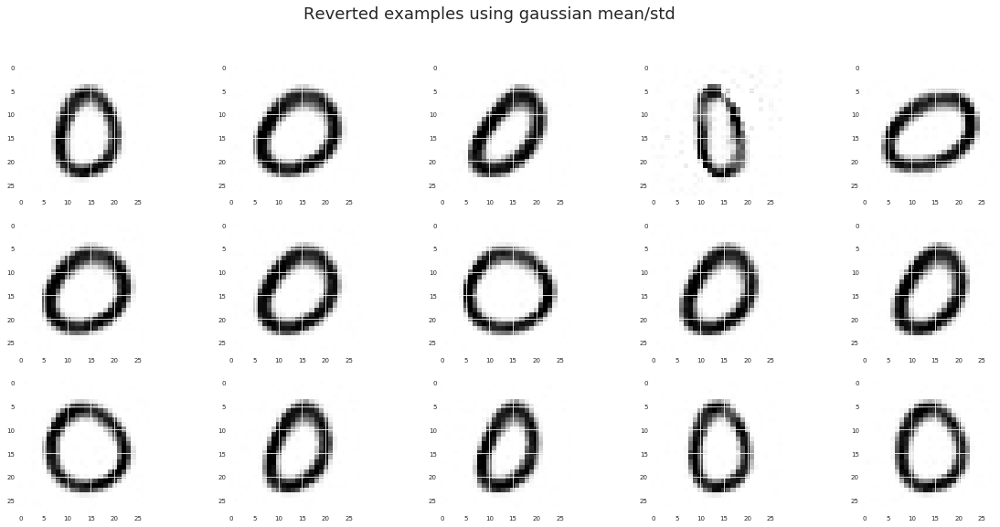

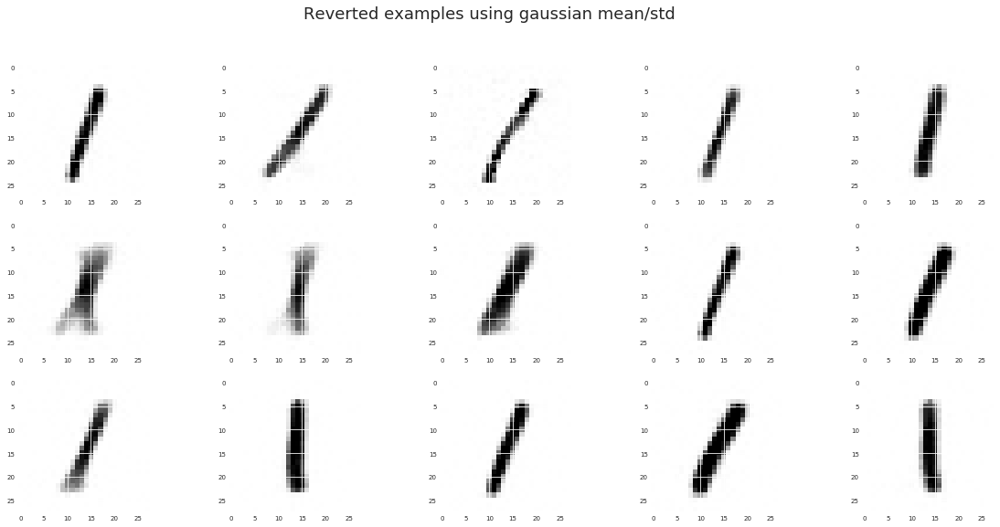

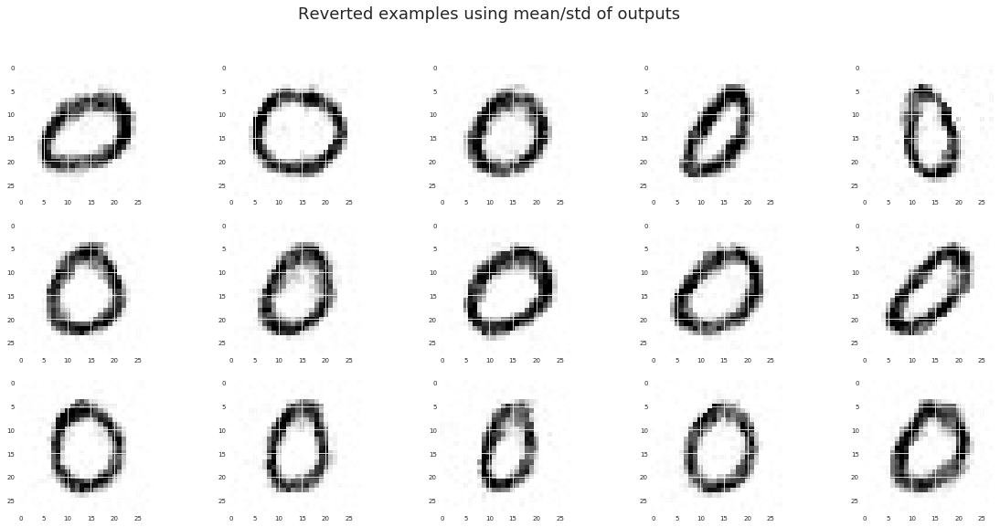

...

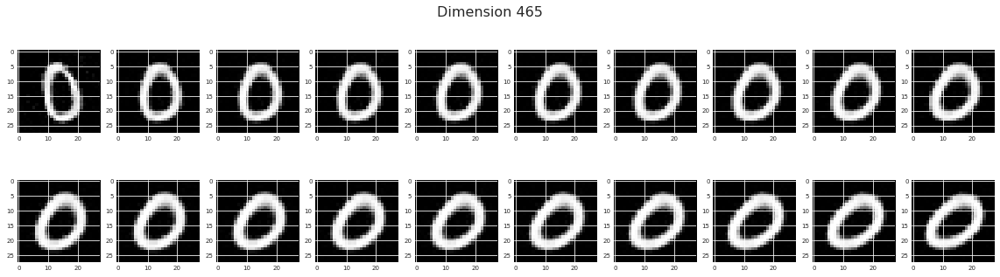

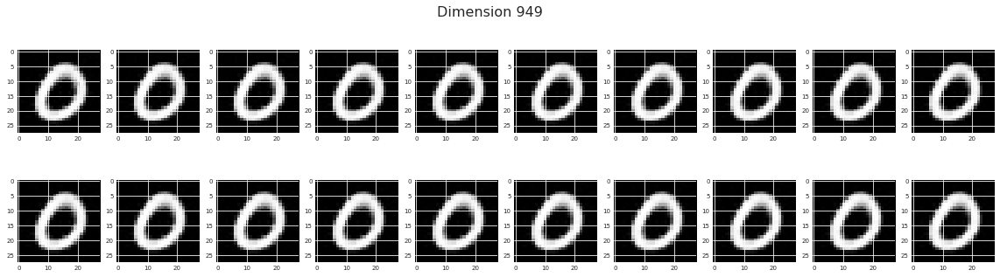

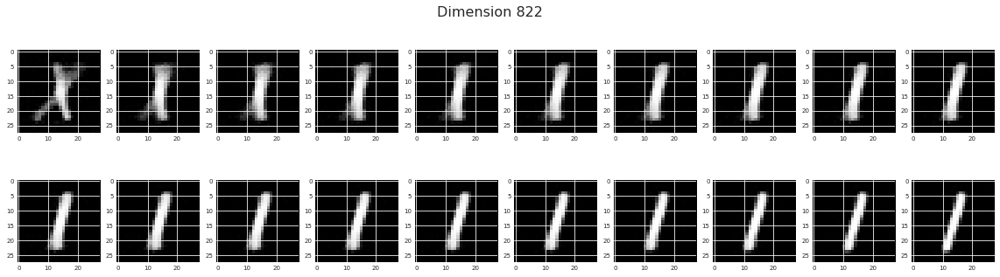

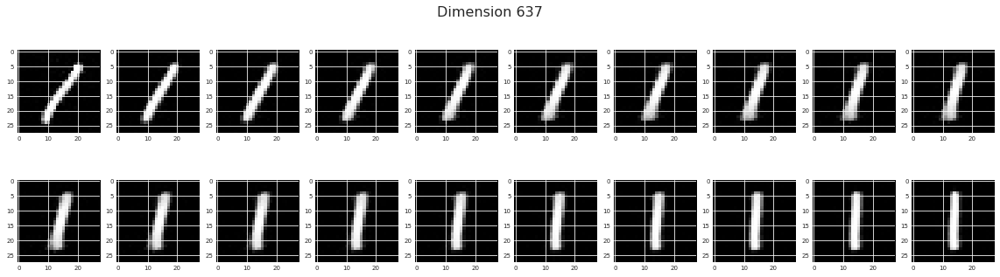

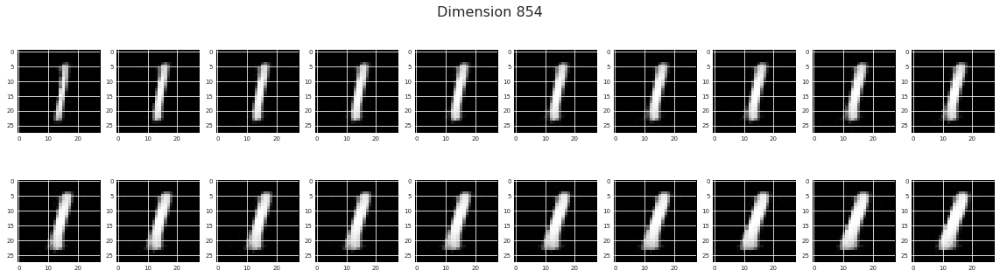

,total_loss
210,1.085367


,total_loss
220,1.053932


,total_loss
230,1.078405


,total_loss
240,1.058192


,total_loss
250,1.041118


,total_loss
260,1.021142


,total_loss
270,1.003201


,total_loss
280,1.10349


,total_loss
290,0.967867


,total_loss
300,0.979782


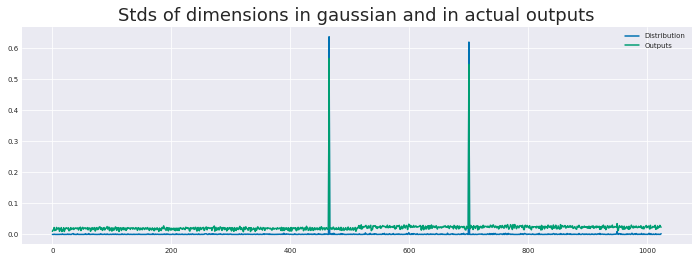

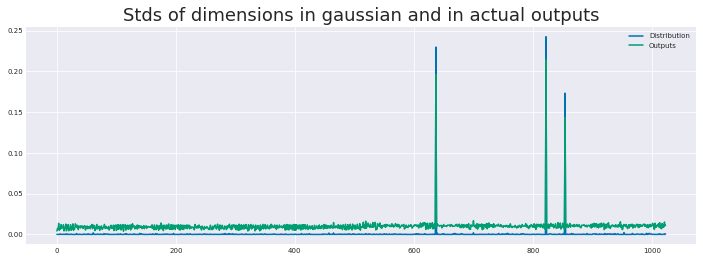

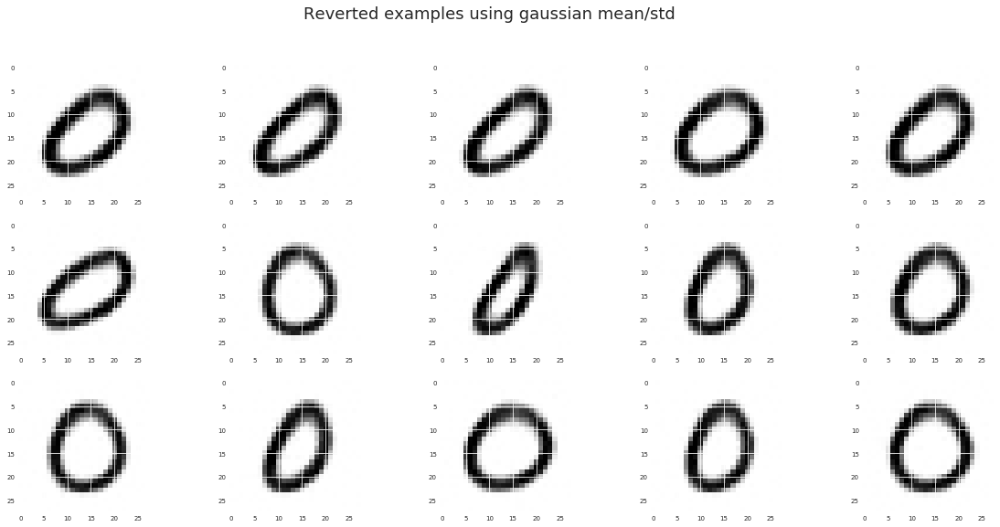

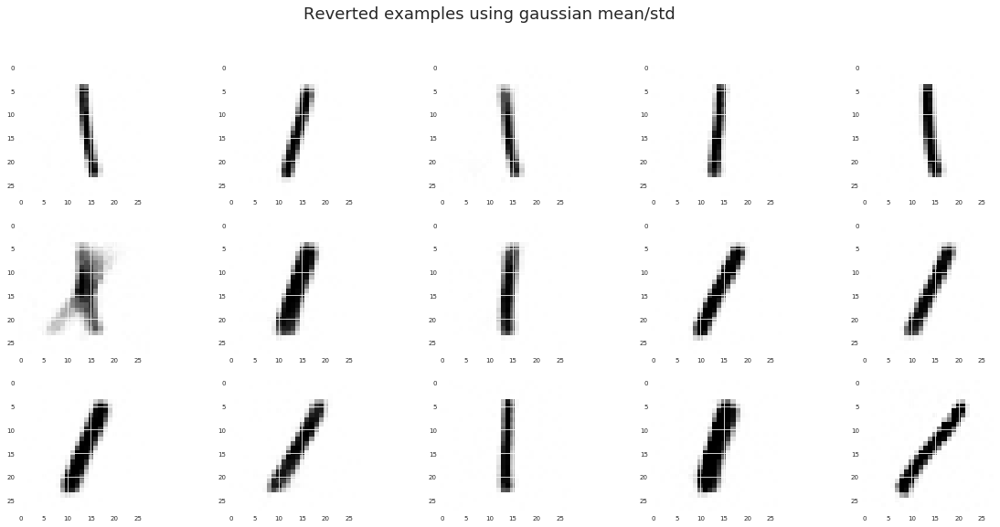

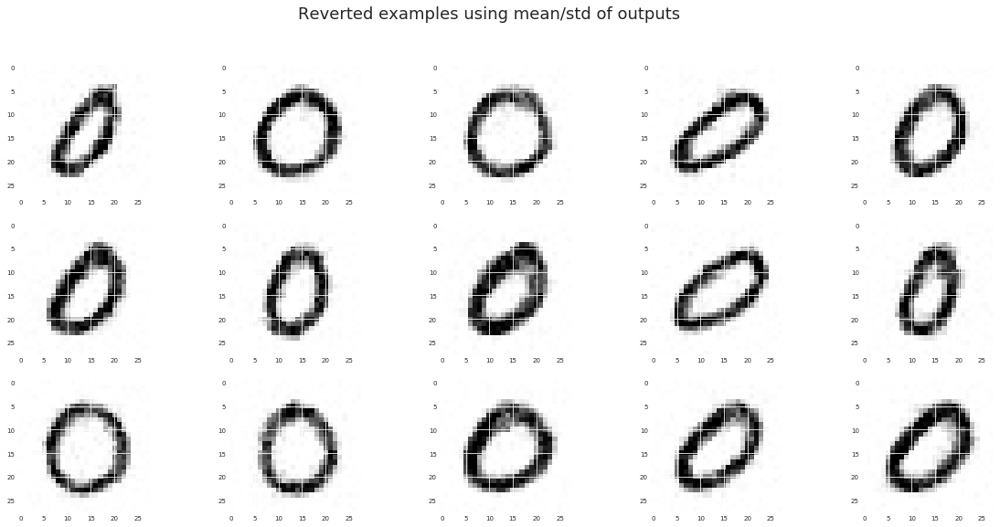

...

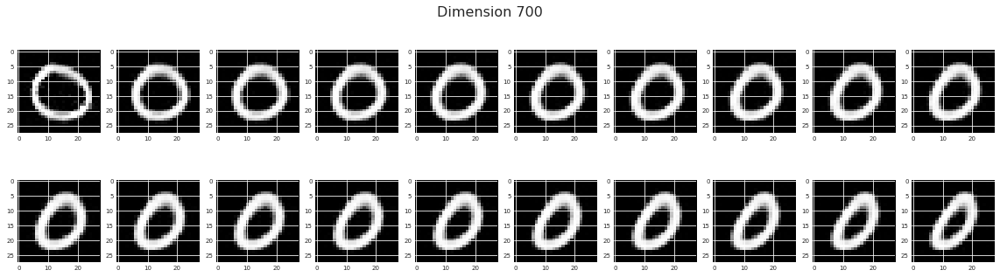

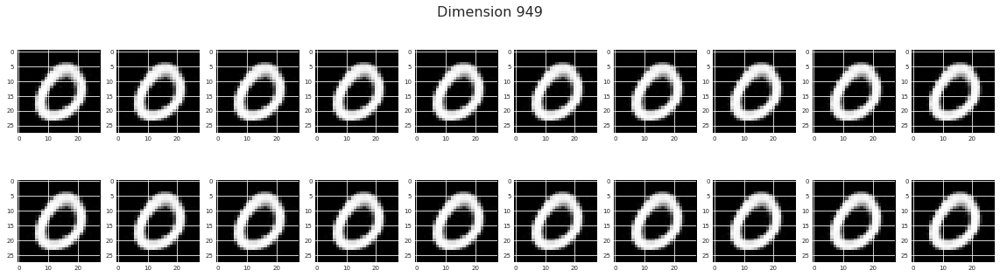

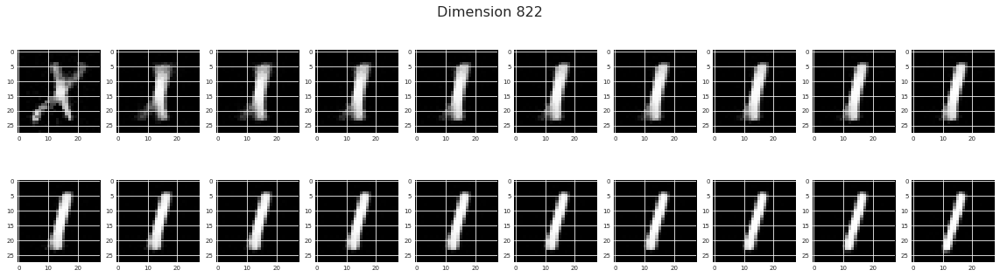

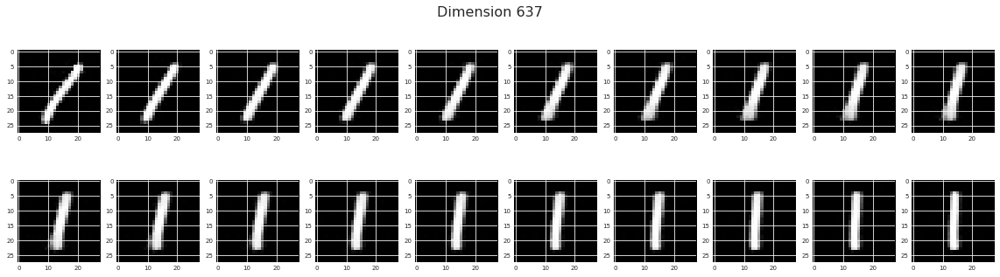

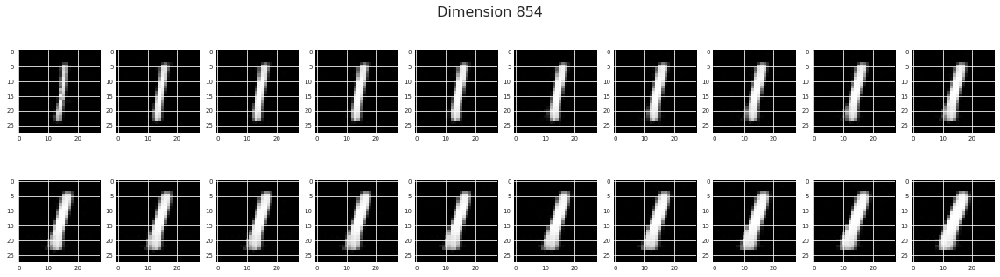

,total_loss
310,0.985342


,total_loss
320,0.949097


,total_loss
330,0.946176


,total_loss
340,0.962809


,total_loss
350,0.958808


,total_loss
360,0.935457


,total_loss
370,0.949331


,total_loss
380,0.941116


,total_loss
390,0.9451


,total_loss
400,0.926004


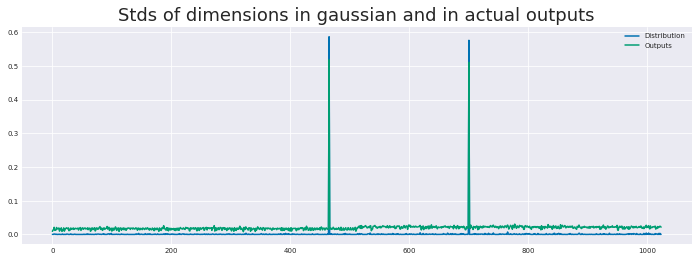

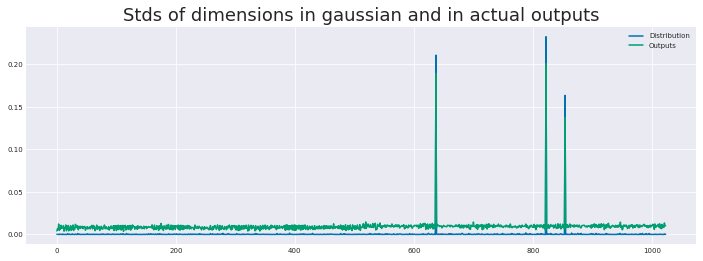

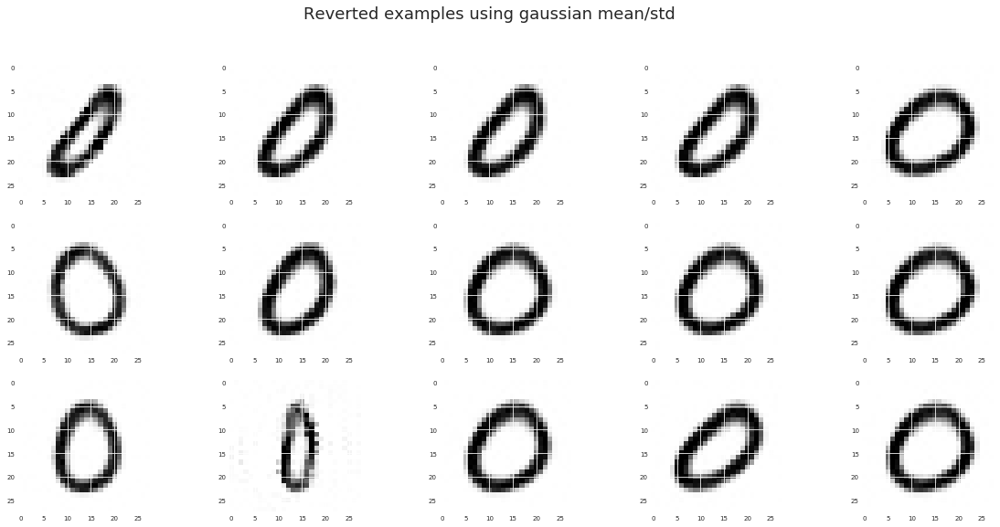

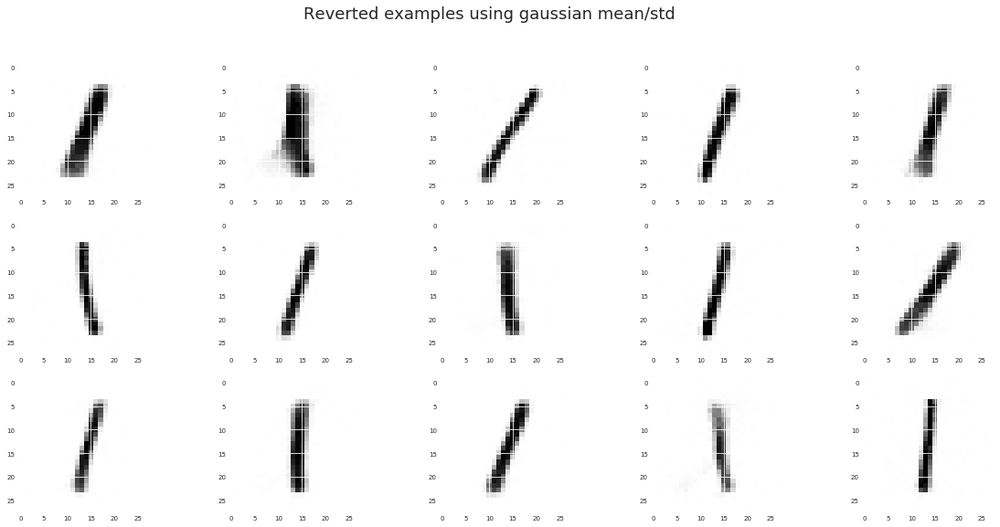

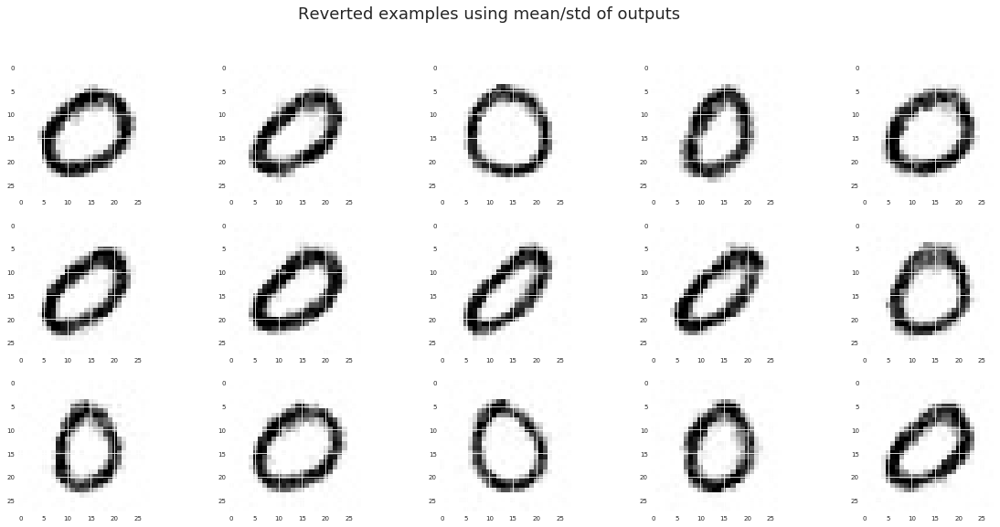

...

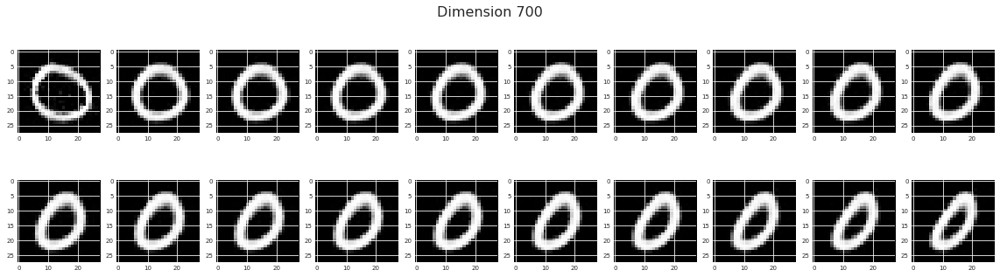

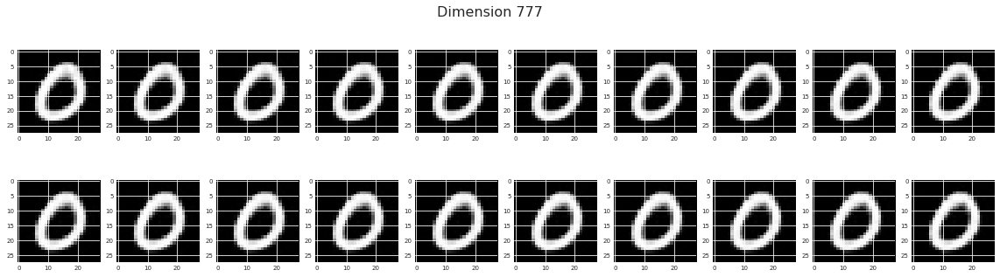

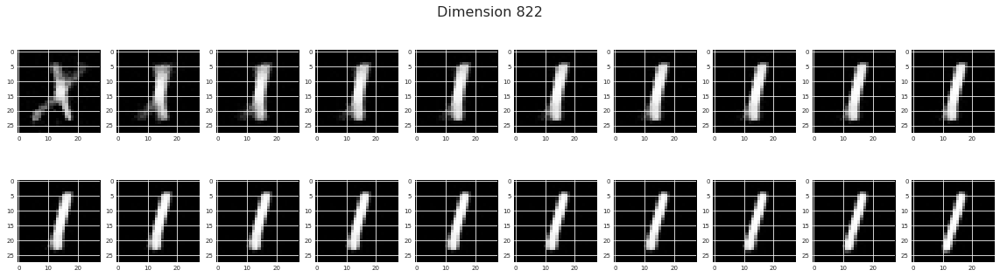

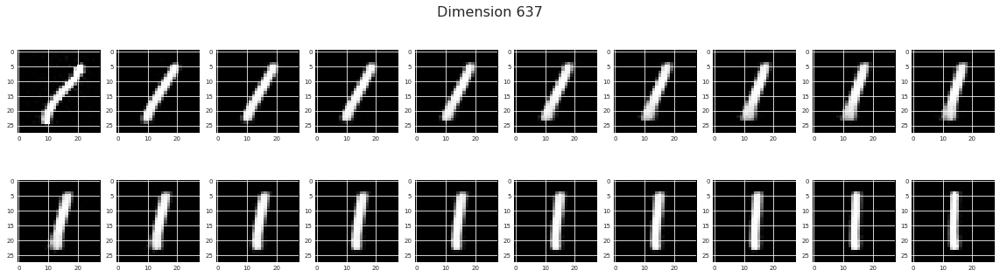

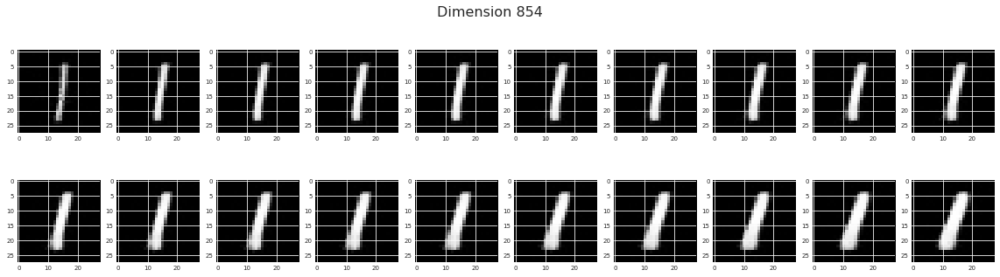

,total_loss
410,0.925989


,total_loss
420,0.896618


,total_loss
430,0.930189


,total_loss
440,0.932228


,total_loss
450,0.918034


,total_loss
460,0.900405


,total_loss
470,0.893161


,total_loss
480,0.867365


,total_loss
490,0.883083


,total_loss
500,0.888057


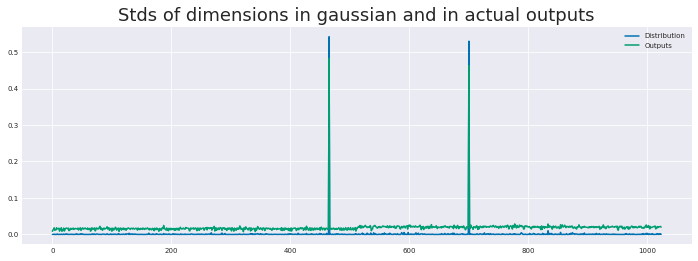

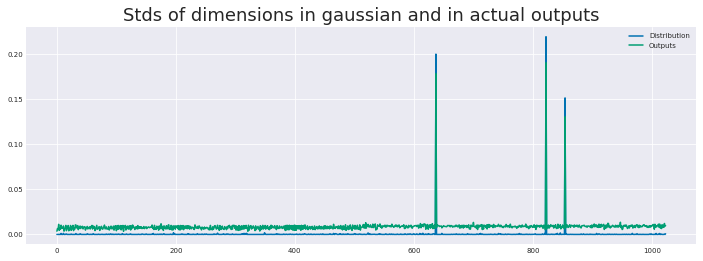

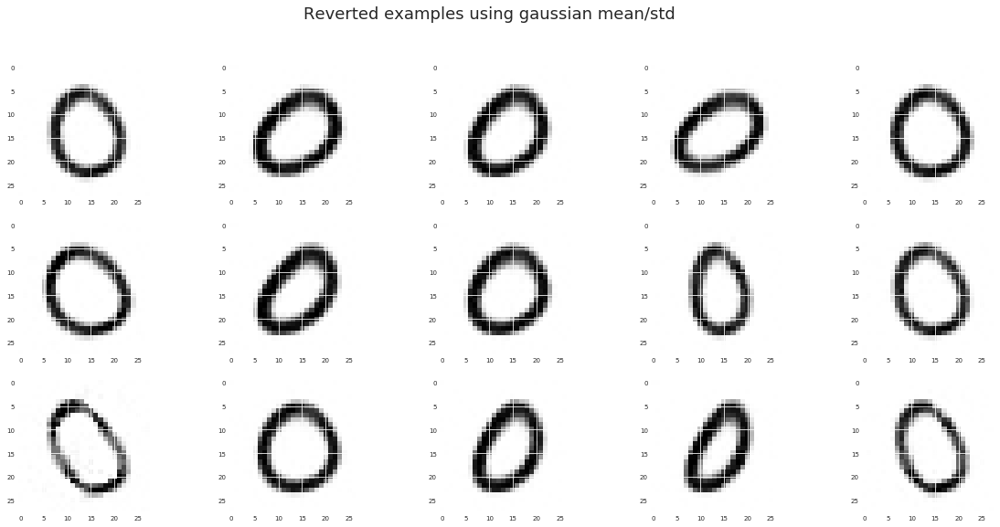

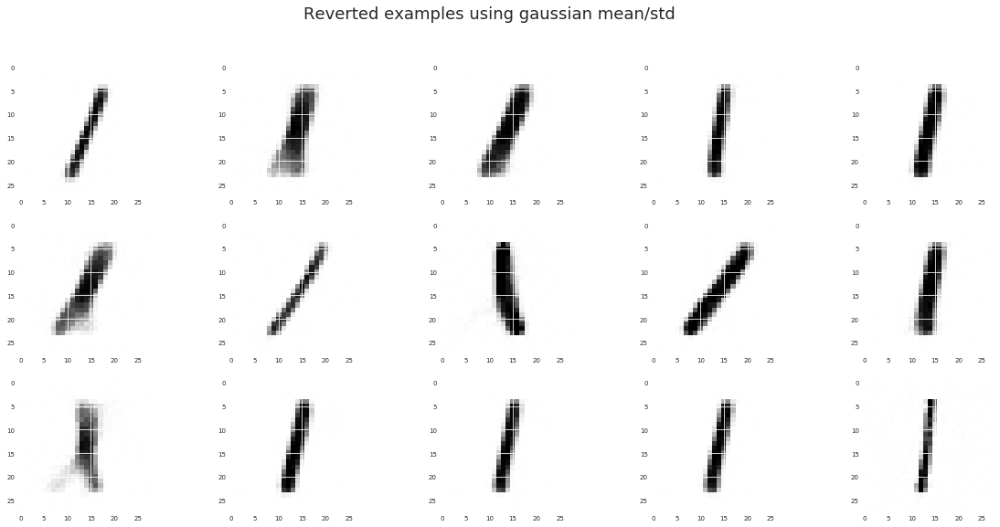

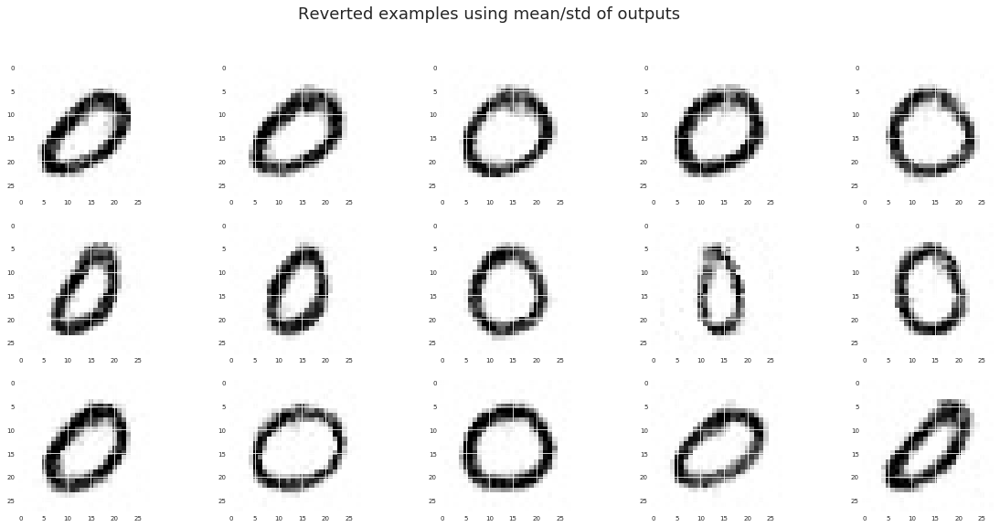

...

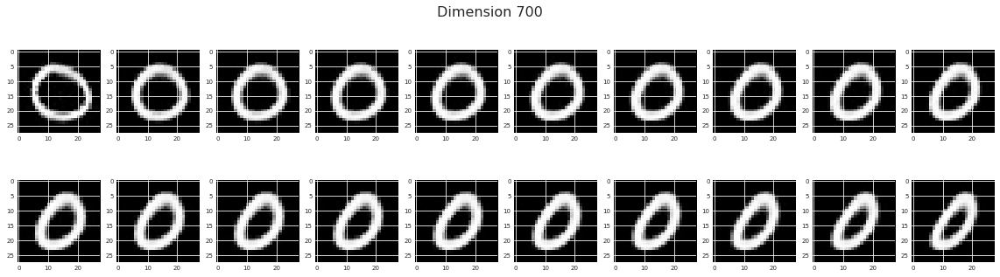

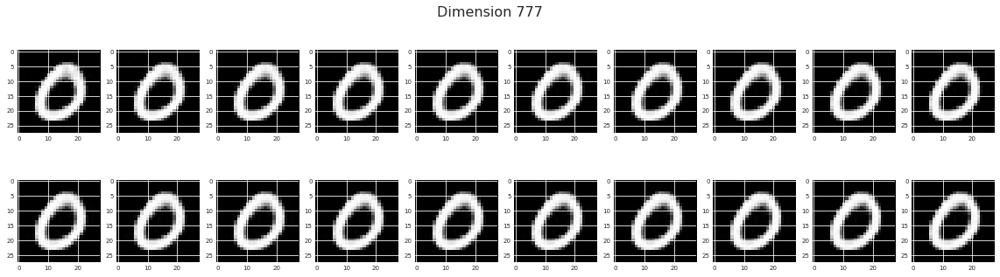

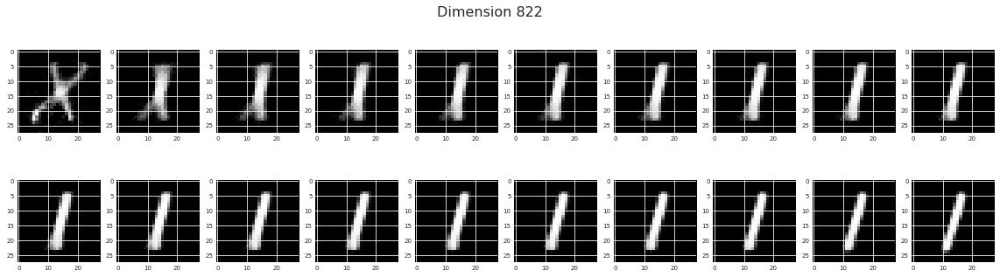

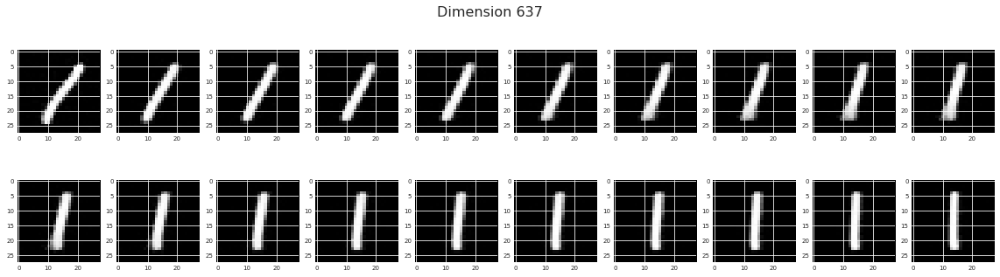

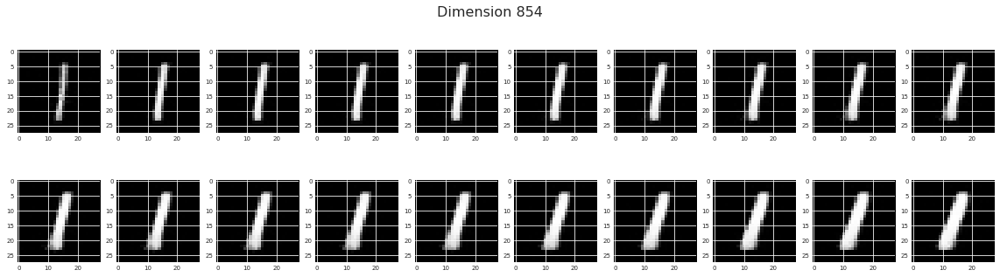

,total_loss
510,0.979832


,total_loss
520,0.878062


,total_loss
530,0.877376


,total_loss
540,0.872829


,total_loss
550,0.860068


,total_loss
560,0.867204


,total_loss
570,0.863365


,total_loss
580,0.888789


,total_loss
590,0.855187


,total_loss
600,0.855669


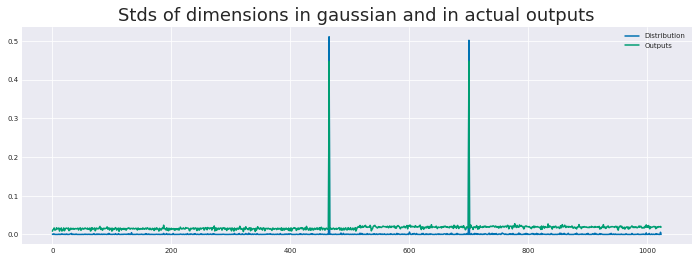

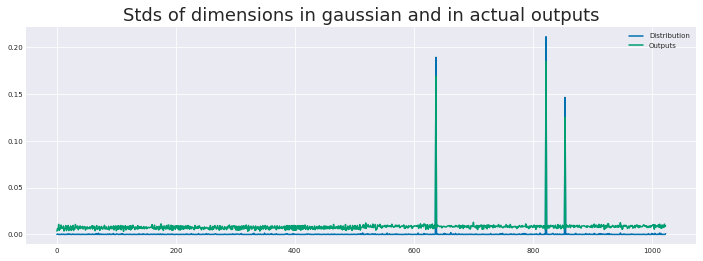

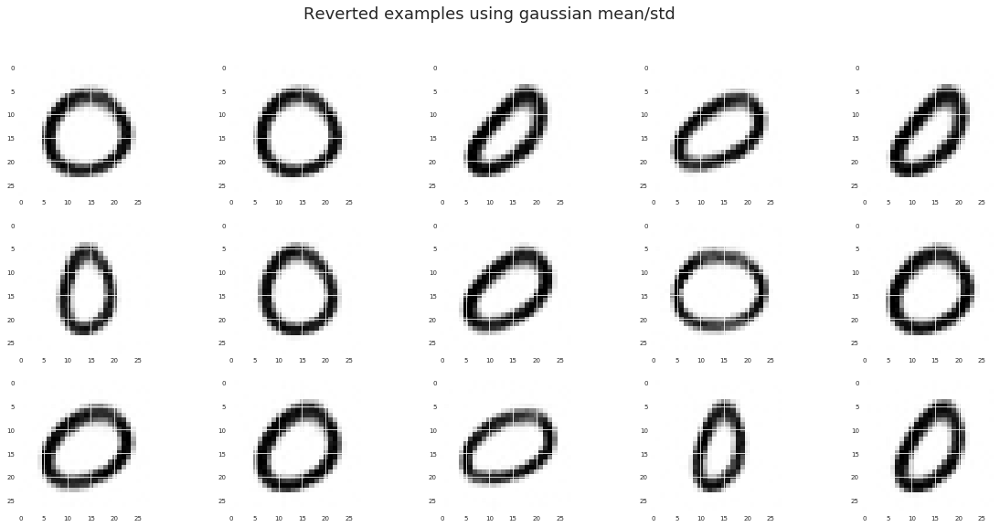

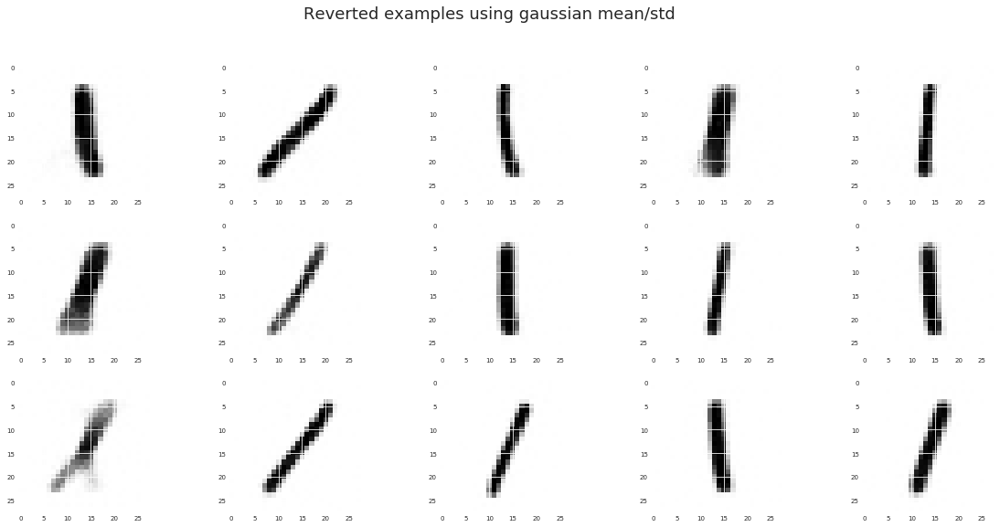

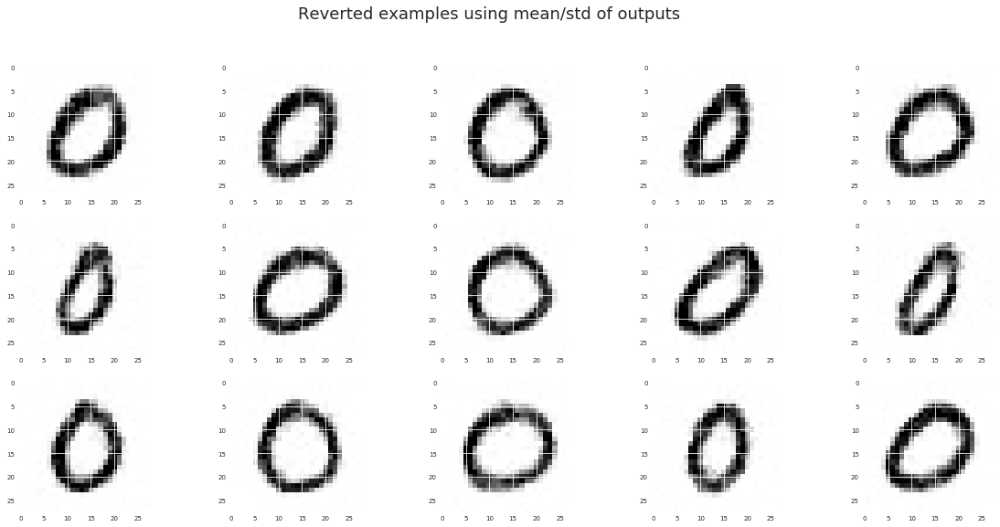

...

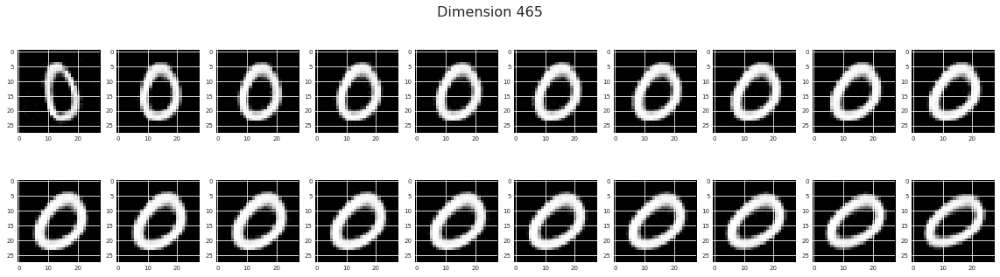

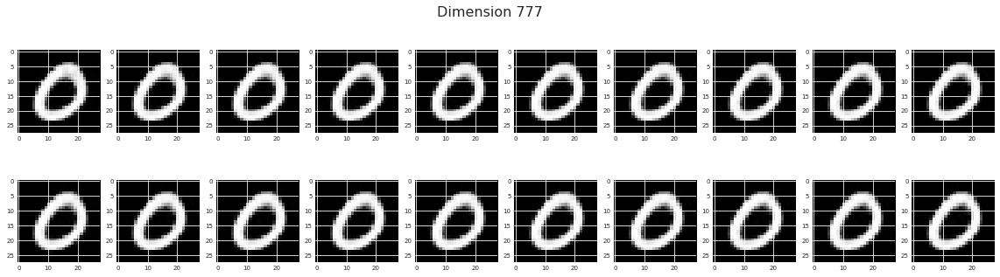

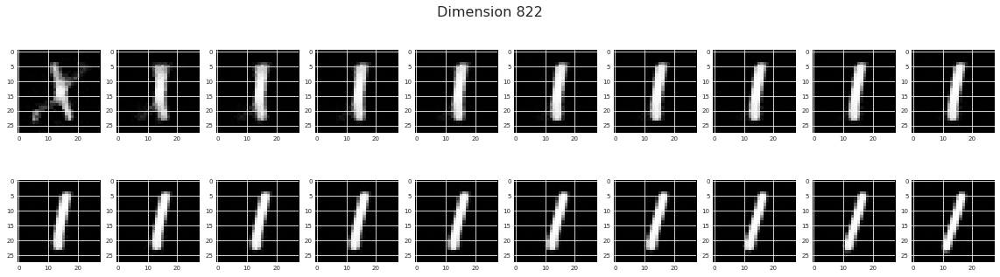

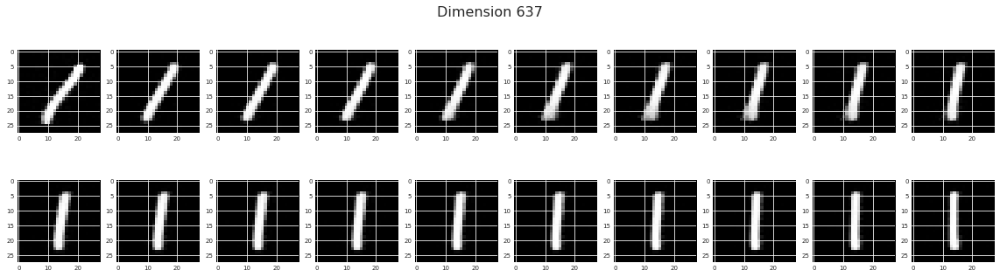

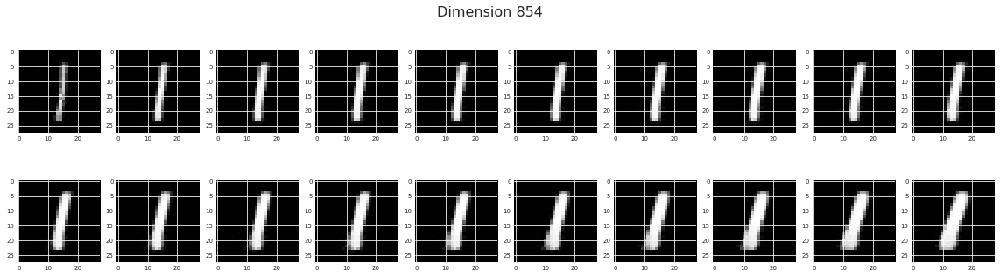

,total_loss
610,0.86435


,total_loss
620,0.836633


,total_loss
630,0.837363


,total_loss
640,0.847477


,total_loss
650,0.842604


,total_loss
660,1.269837


,total_loss
670,0.836148


,total_loss
680,0.828331


,total_loss
690,0.829735


,total_loss
700,0.84644


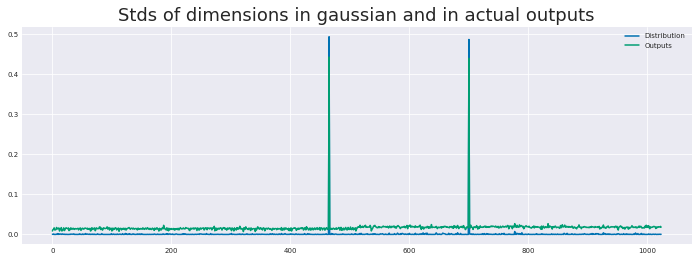

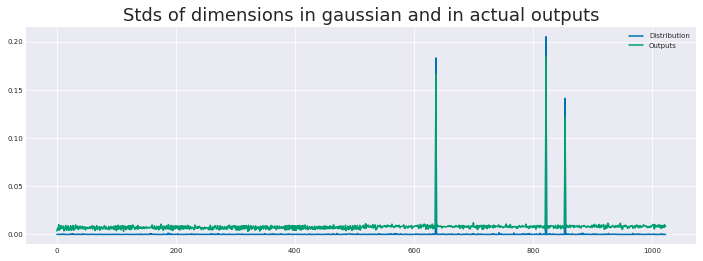

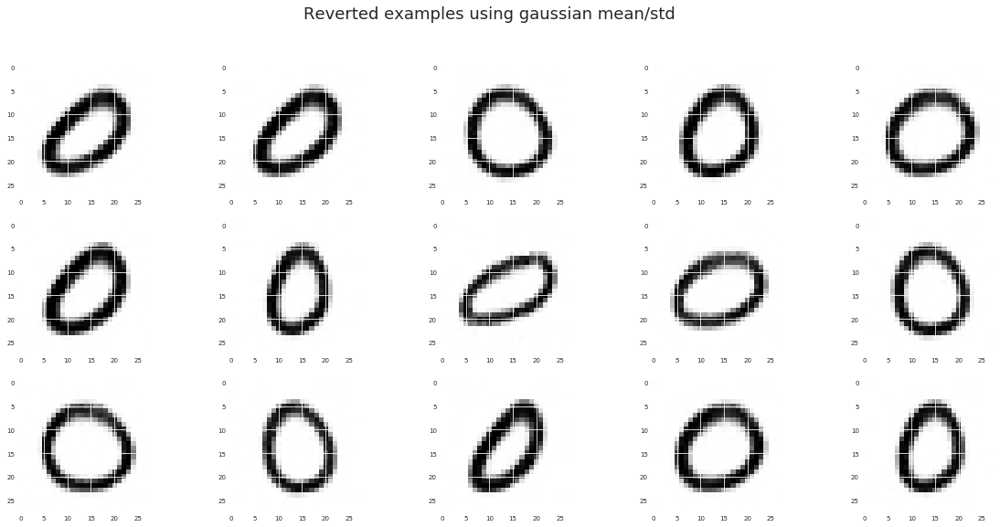

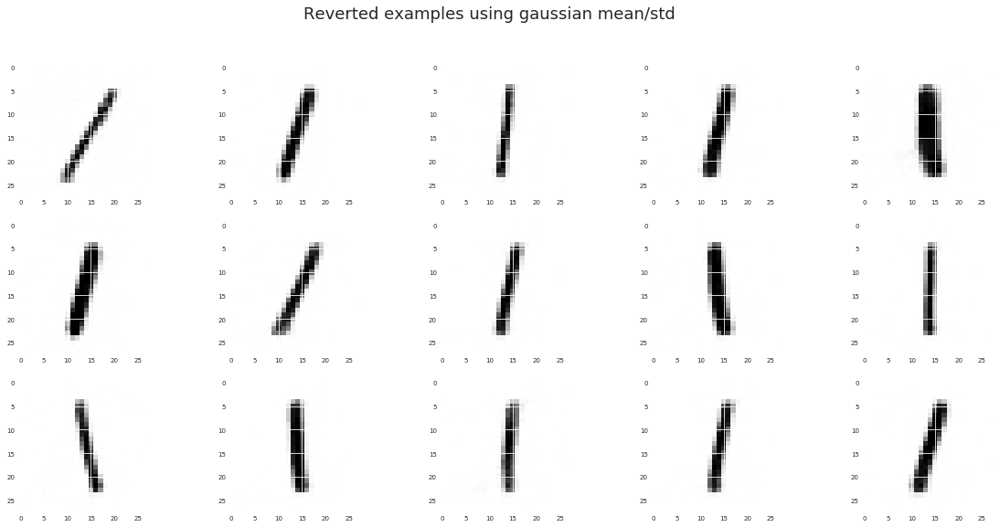

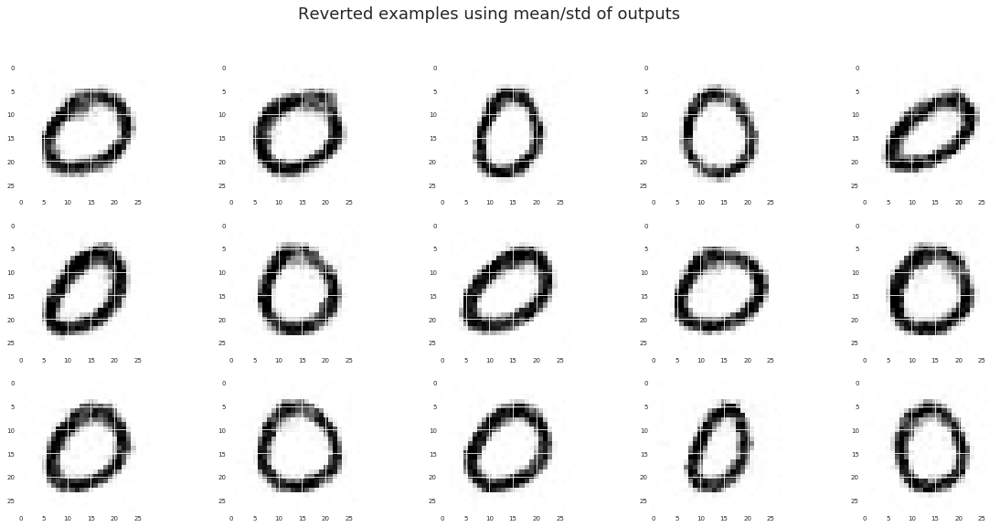

...

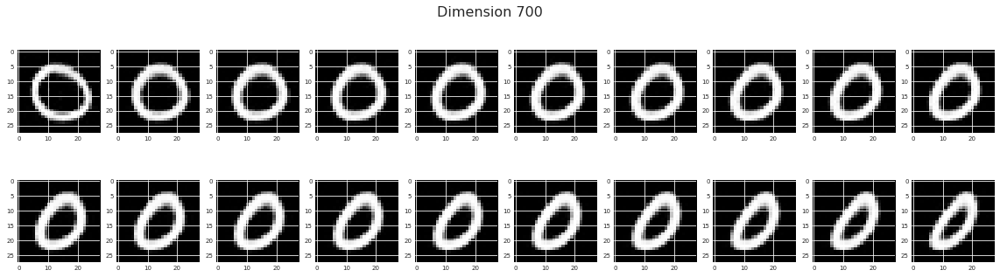

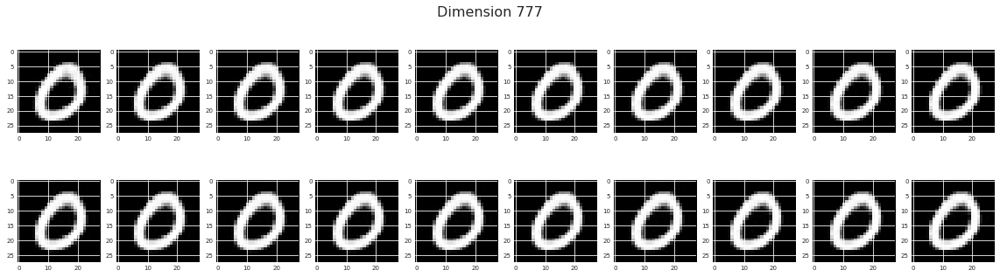

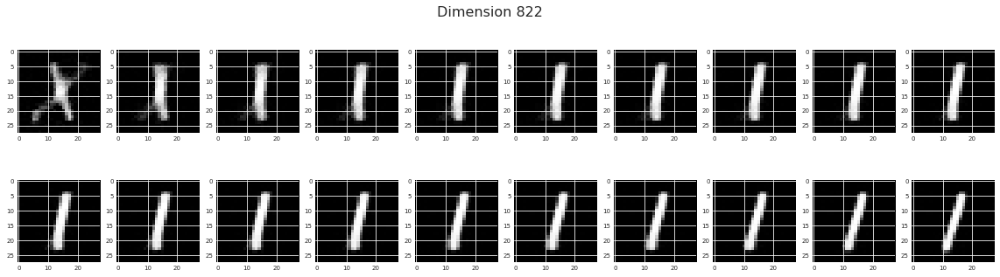

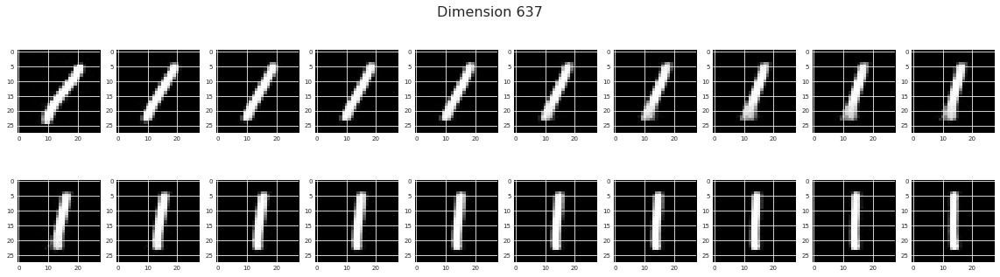

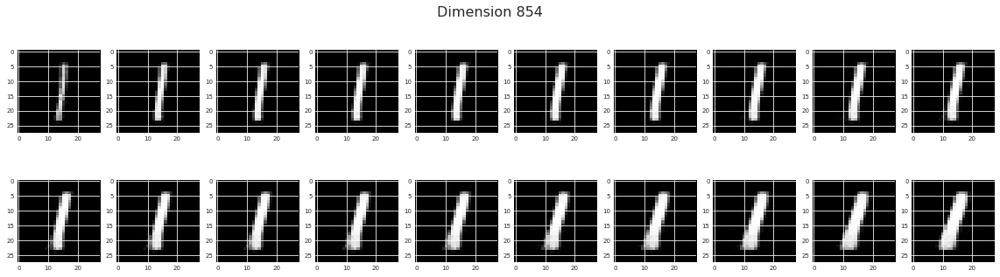

,total_loss
710,0.823528


,total_loss
720,0.826232


,total_loss
730,0.87169


,total_loss
740,0.83257


,total_loss
750,0.815591


,total_loss
760,0.835314


,total_loss
770,1.045969


,total_loss
780,0.850104


,total_loss
790,0.816213


,total_loss
800,0.807434


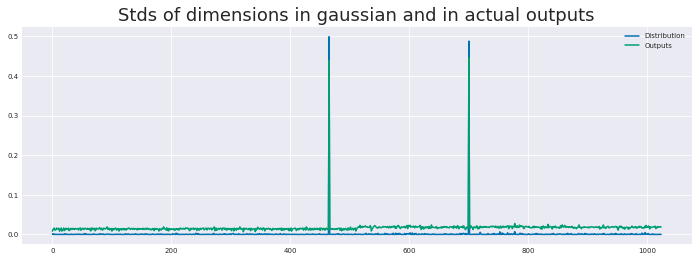

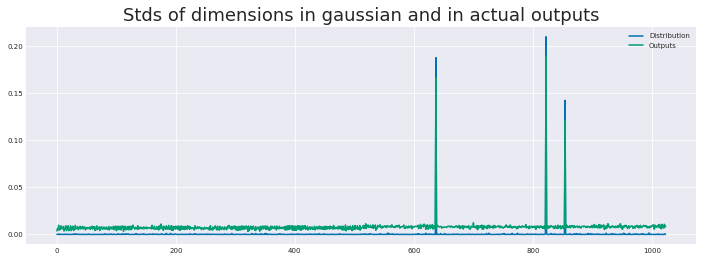

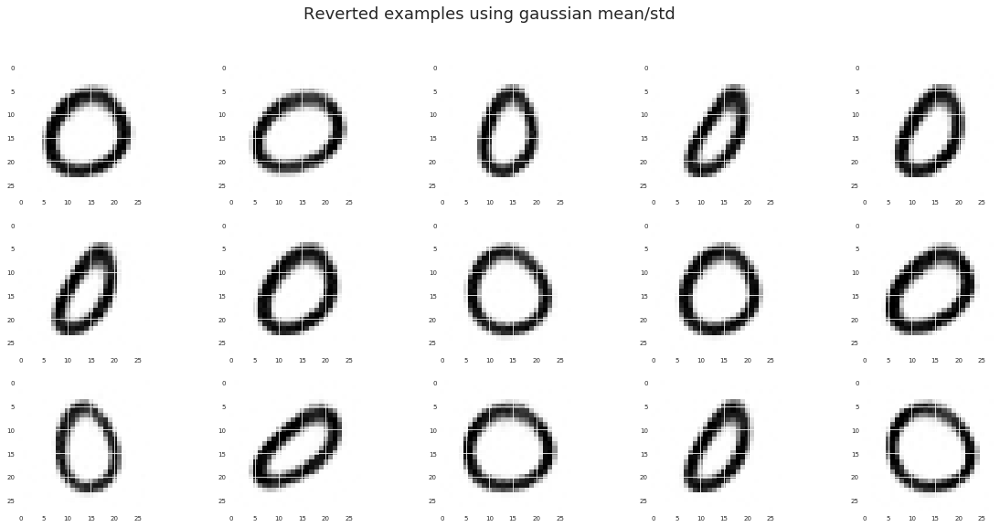

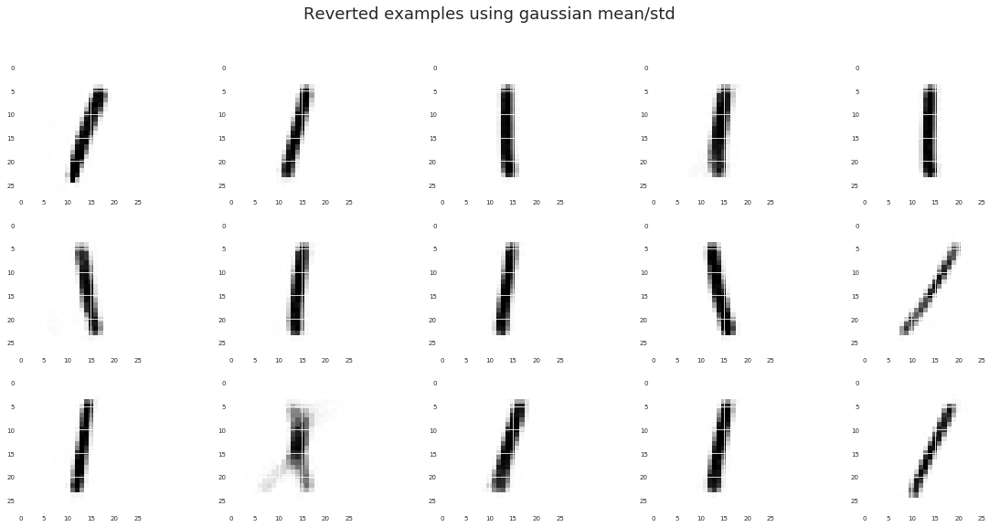

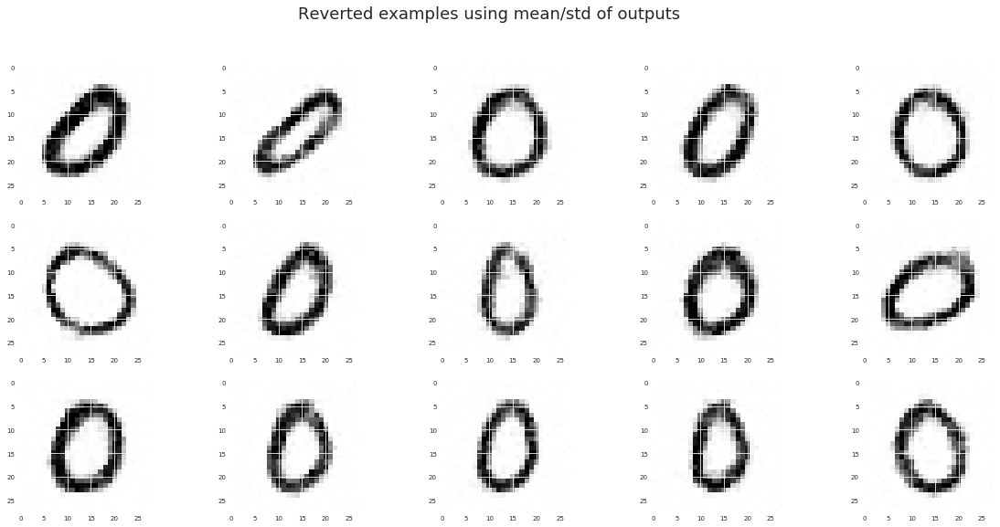

...

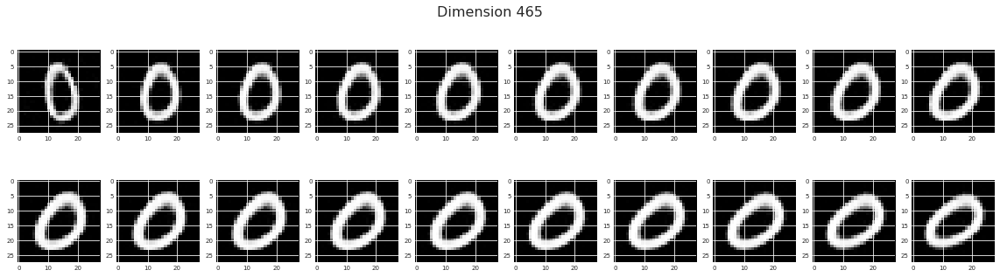

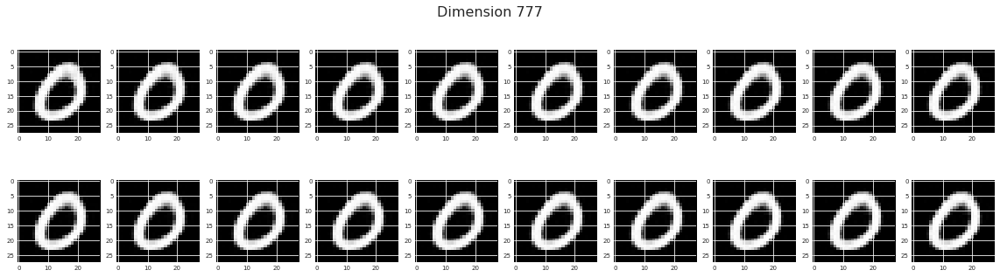

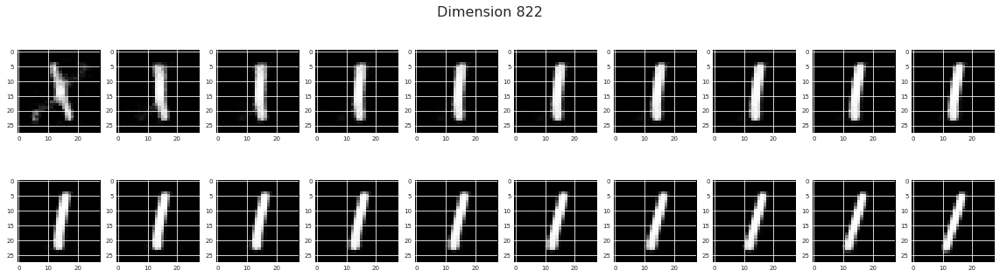

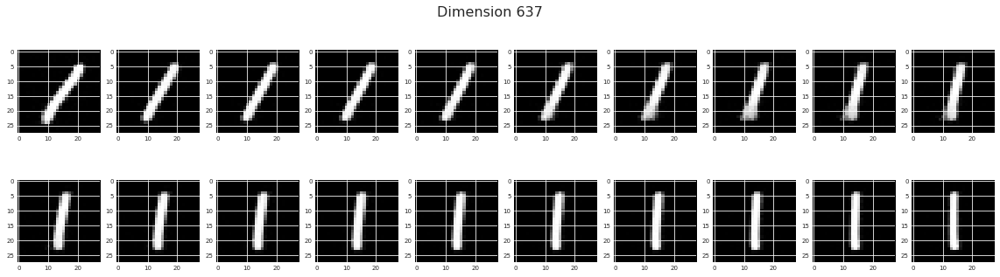

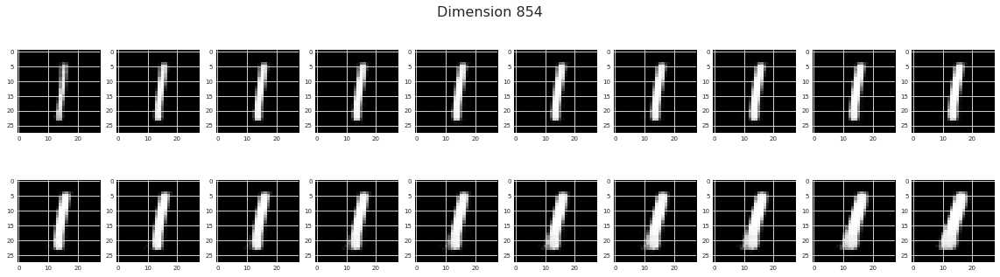

,total_loss
810,0.818689


,total_loss
820,0.832021


,total_loss
830,0.813982


,total_loss
840,0.807389


,total_loss
850,0.862739


,total_loss
860,0.812491


,total_loss
870,0.823511


,total_loss
880,0.803774


,total_loss
890,1.973611


,total_loss
900,1.076979


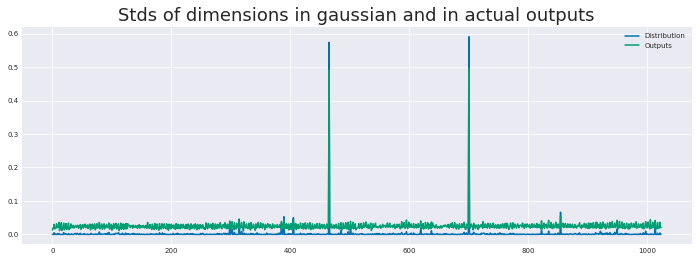

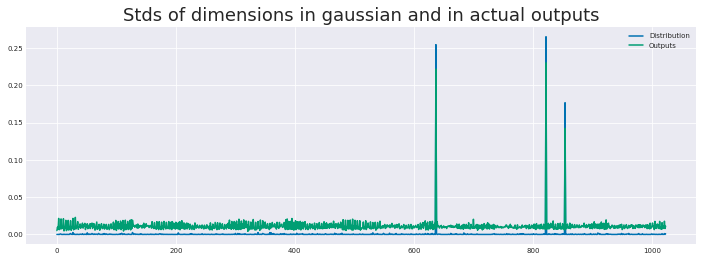

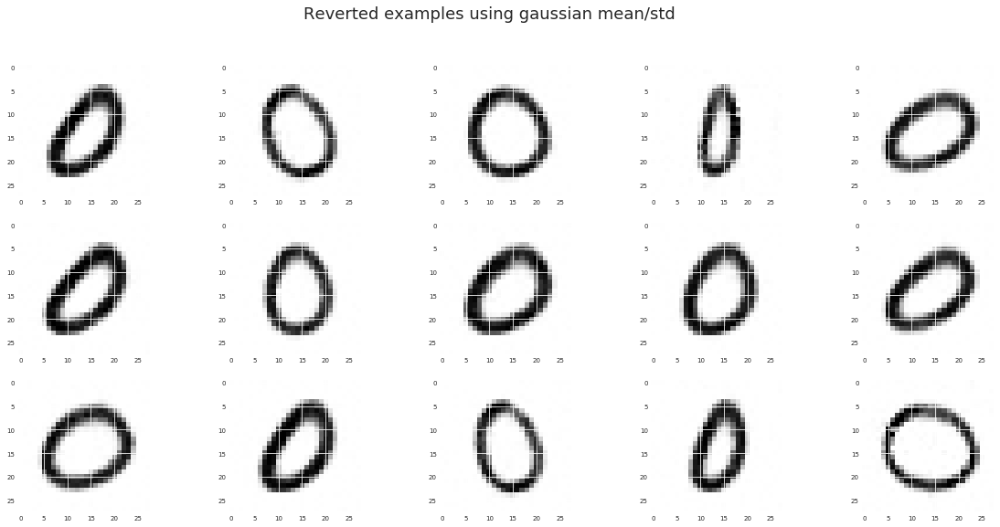

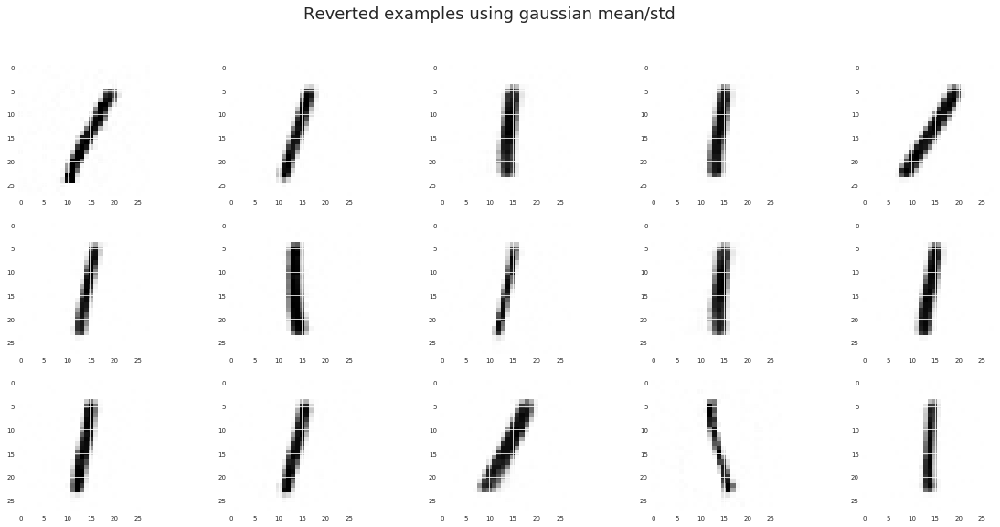

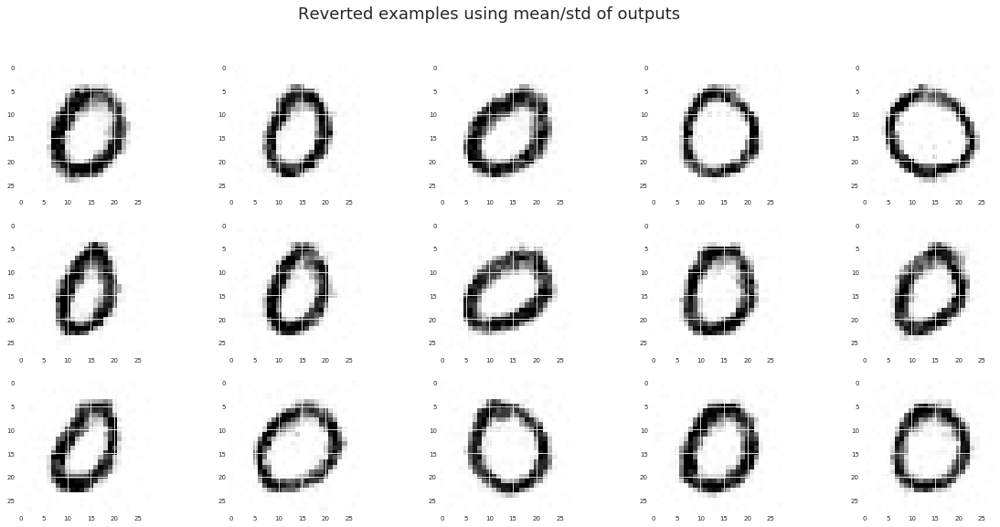

...

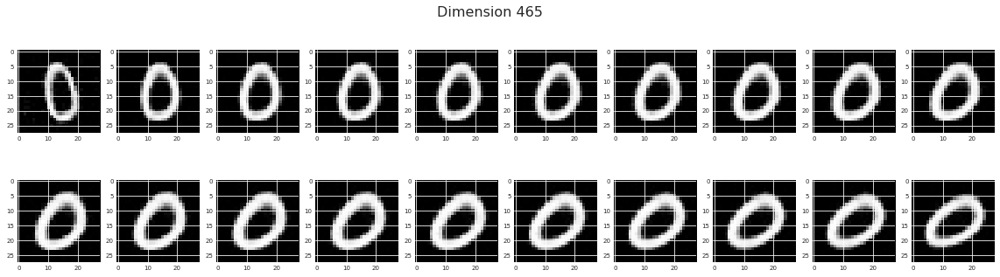

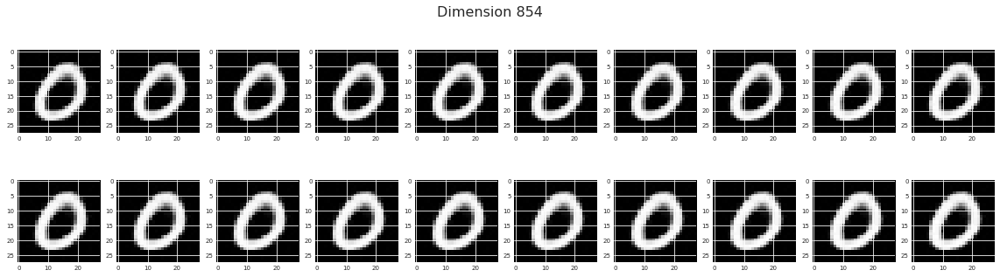

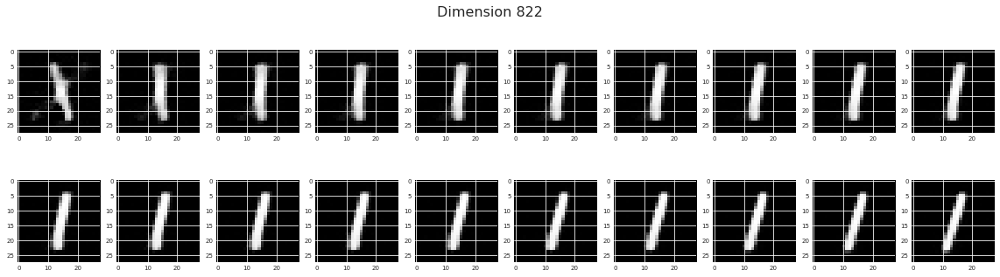

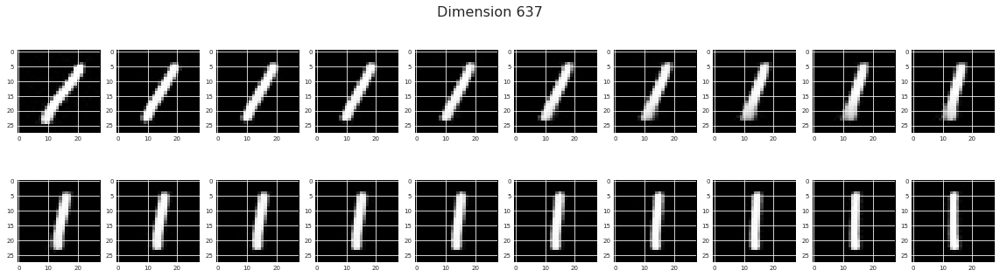

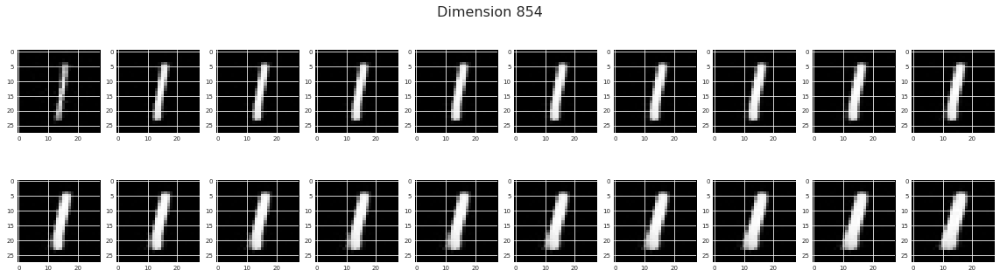

,total_loss
910,0.914579


,total_loss
920,0.893584


,total_loss
930,0.861684


,total_loss
940,0.851927


,total_loss
950,0.843073


,total_loss
960,0.841029


,total_loss
970,0.827318


,total_loss
980,0.82201


,total_loss
990,0.815023


,total_loss
1000,0.799634


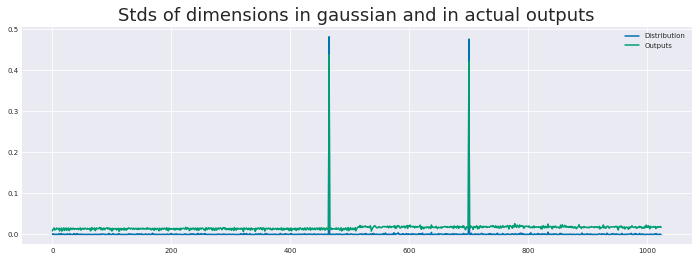

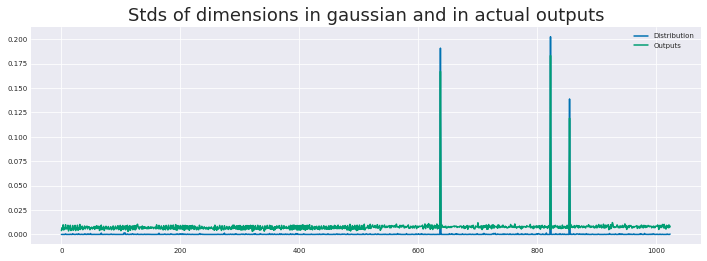

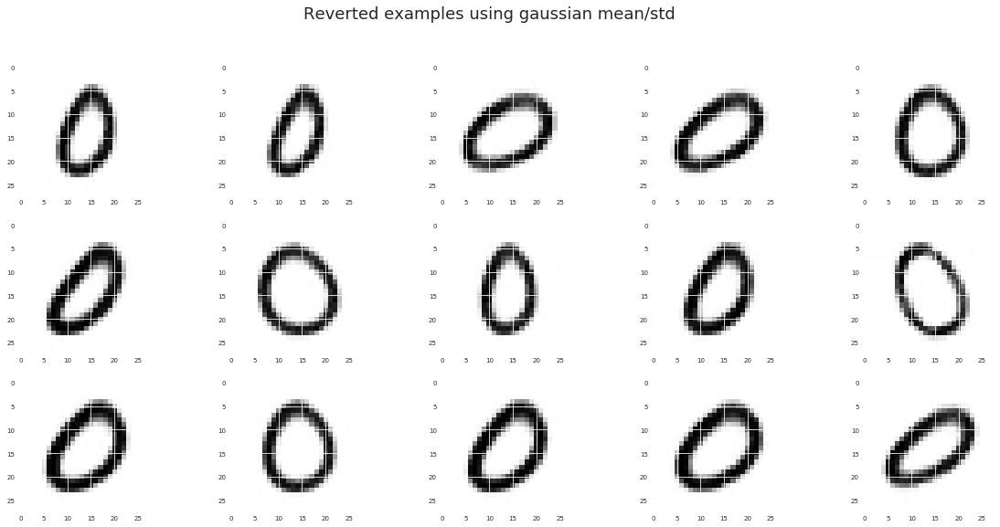

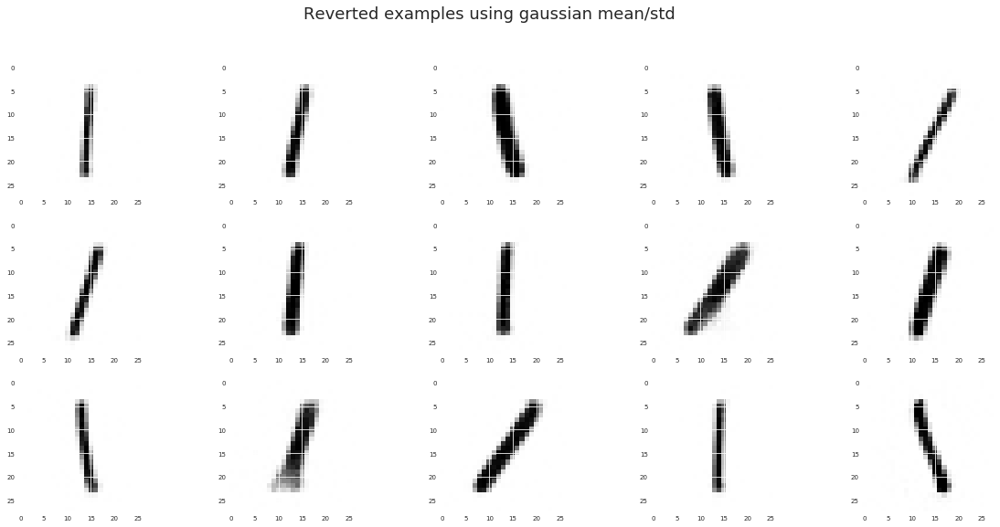

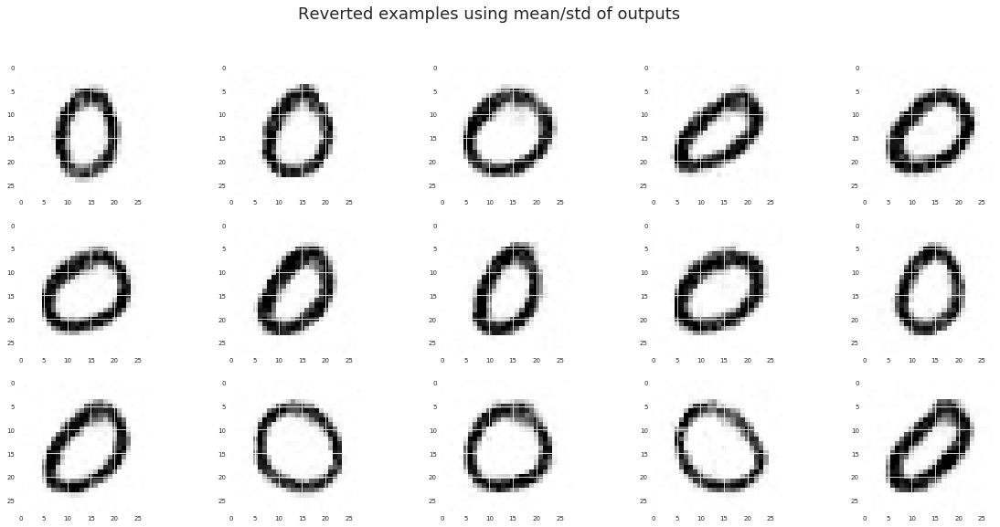

...

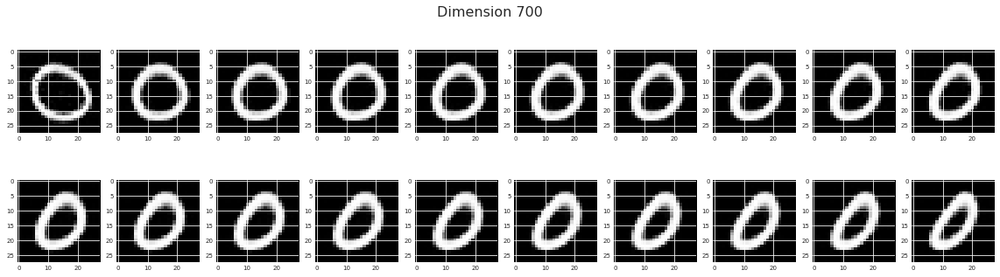

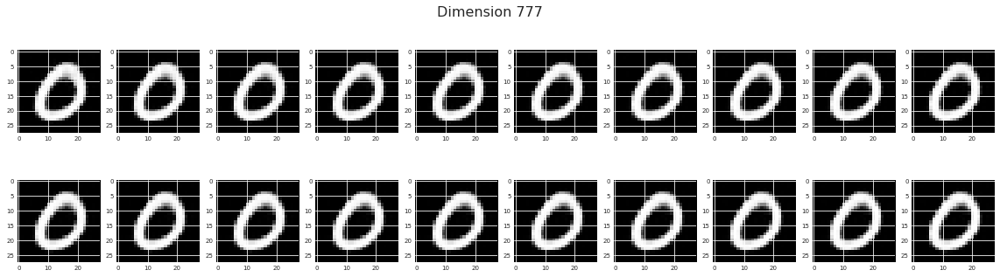

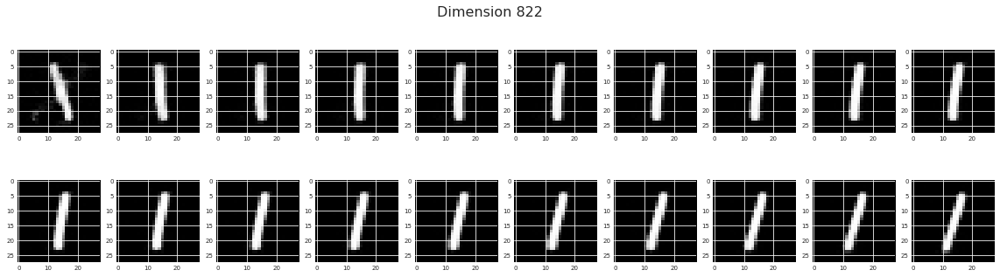

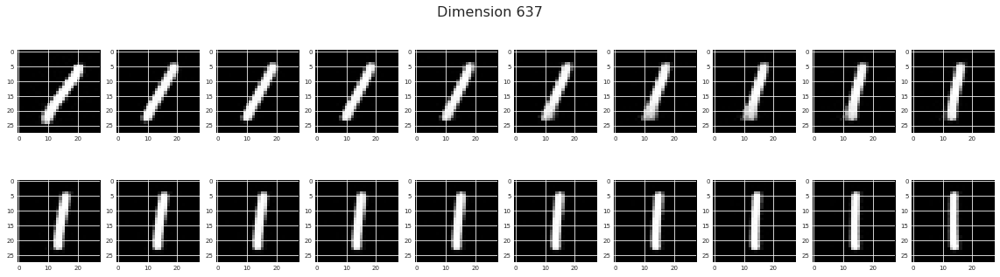

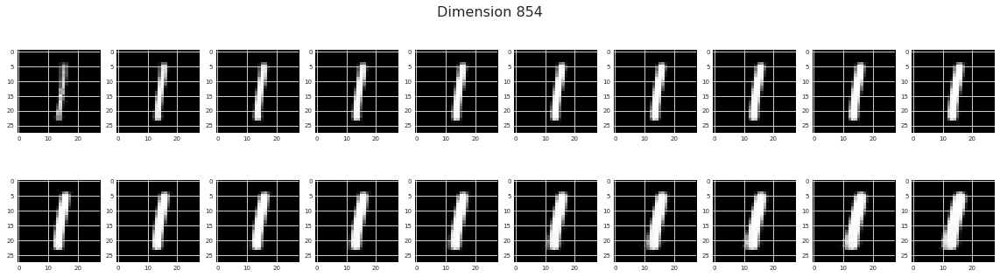

,total_loss
1010,0.815219


,total_loss
1020,0.811512


,total_loss
1030,0.810721


,total_loss
1040,0.804949


,total_loss
1050,0.80346


,total_loss
1060,0.798899


,total_loss
1070,0.820444


,total_loss
1080,0.797286


,total_loss
1090,0.788393


,total_loss
1100,0.796075


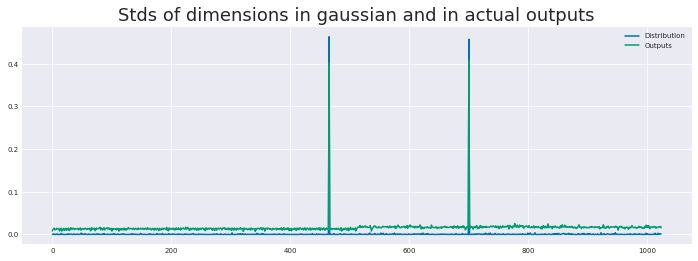

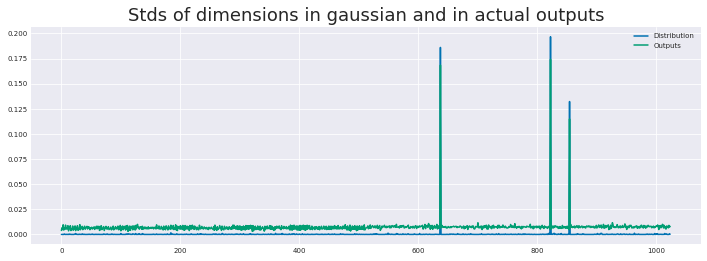

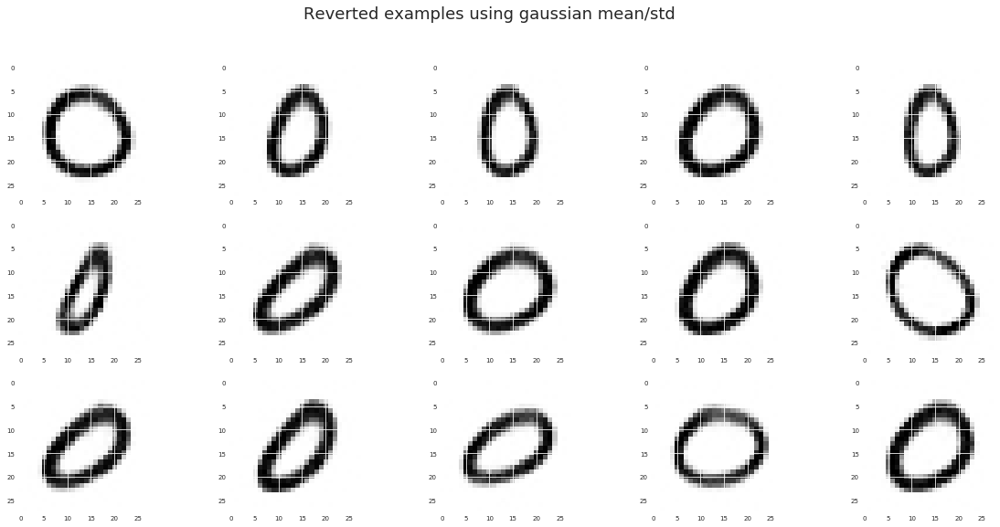

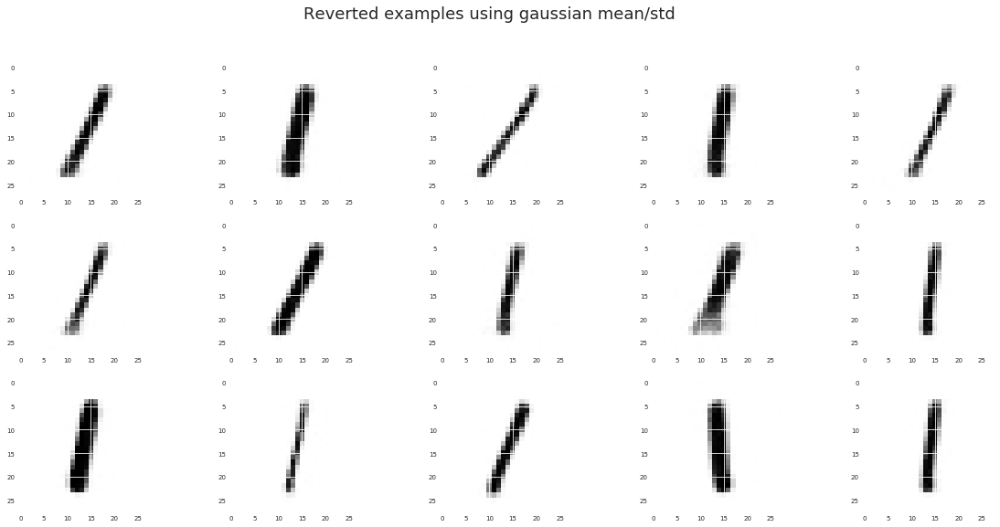

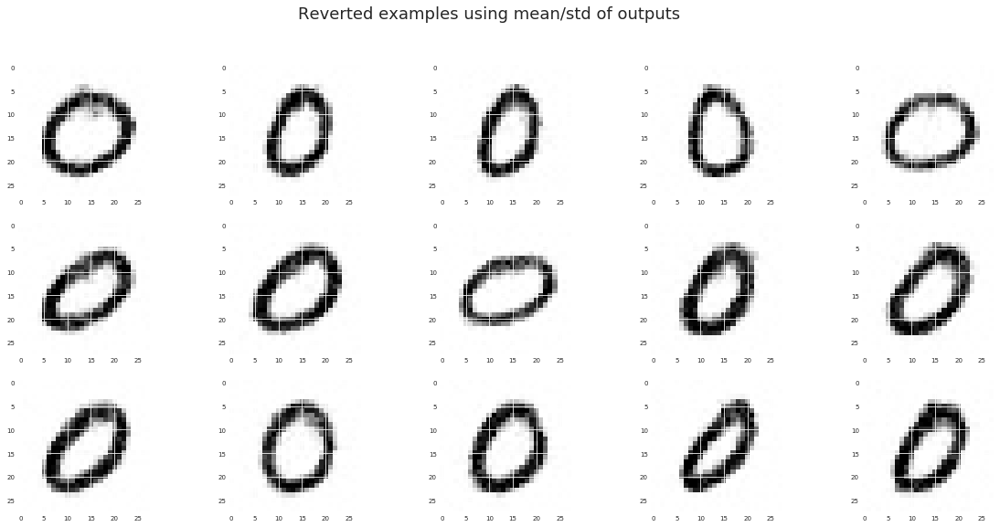

...

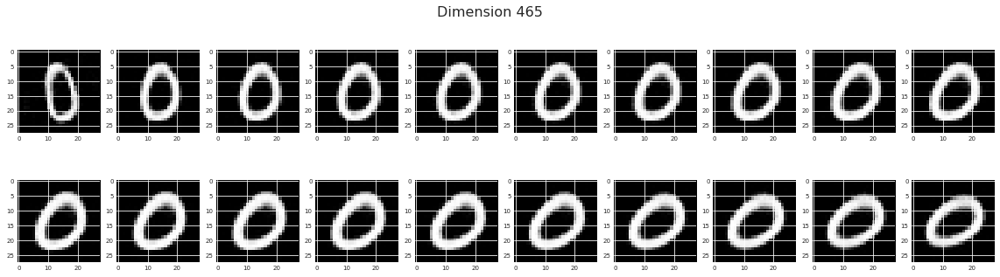

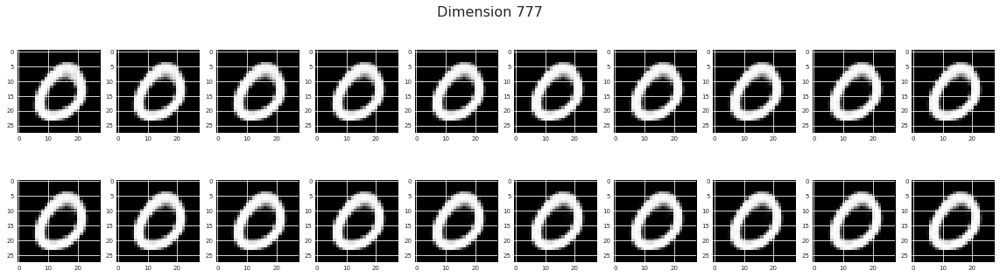

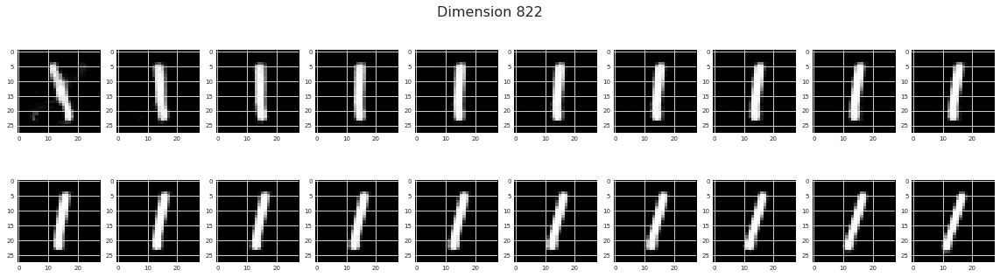

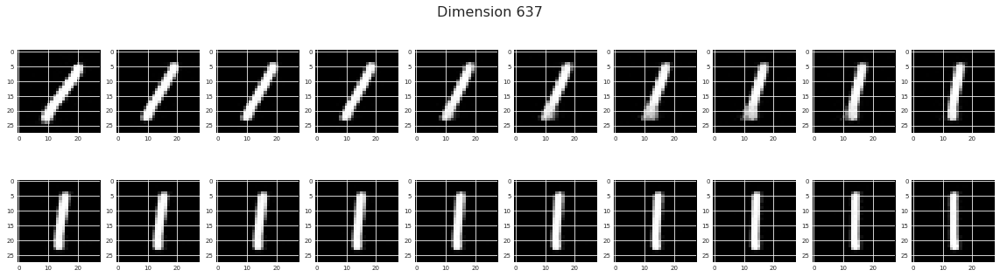

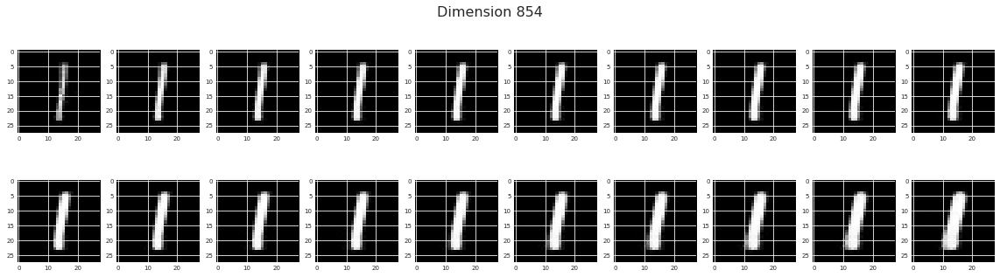

,total_loss
1110,0.788455


,total_loss
1120,0.784757


,total_loss
1130,0.792187


,total_loss
1140,0.779272


,total_loss
1150,0.790533


,total_loss
1160,0.7862


,total_loss
1170,0.803085


,total_loss
1180,13.028625


,total_loss
1190,1.740669


,total_loss
1200,1.488608


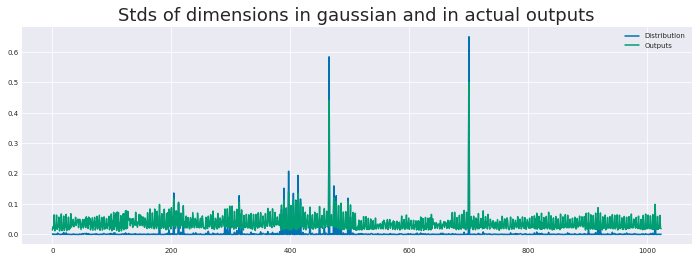

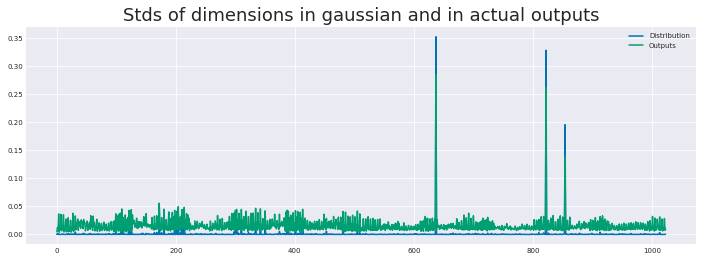

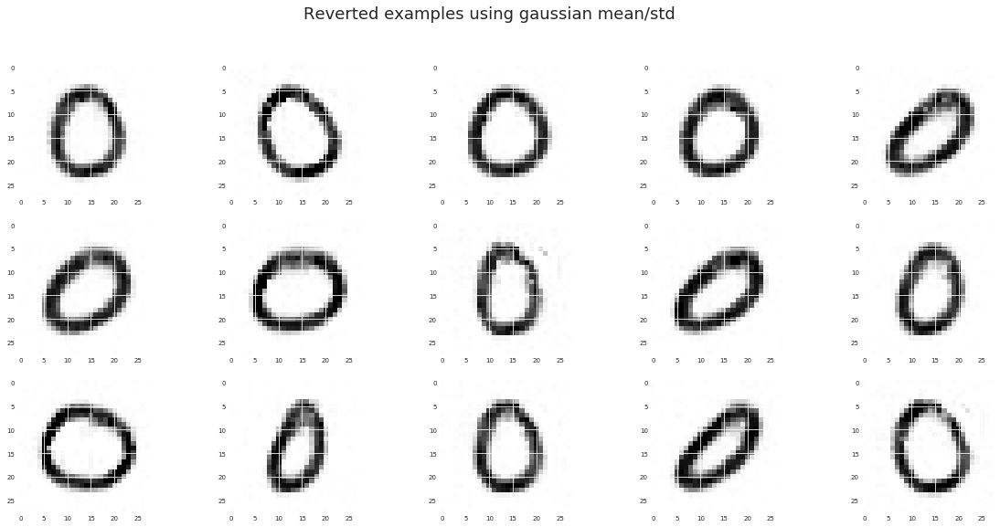

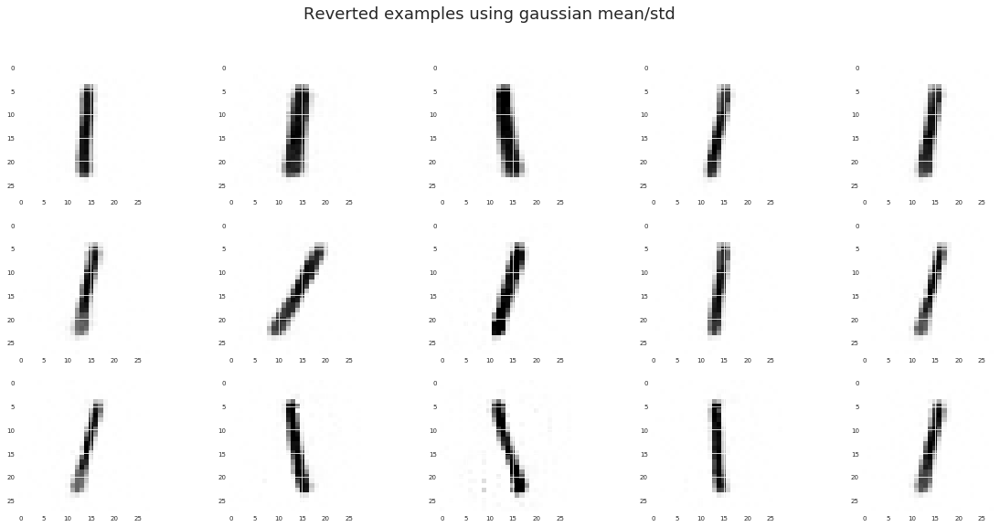

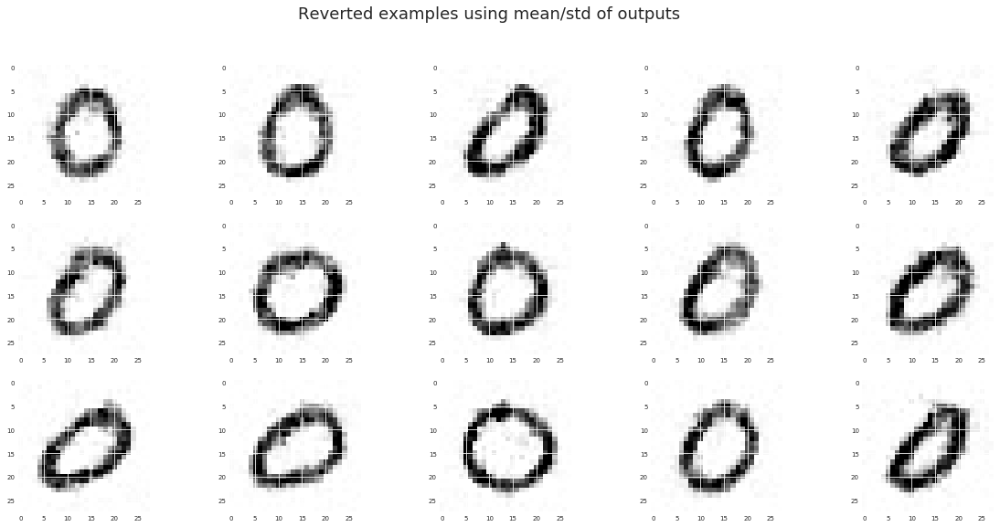

...

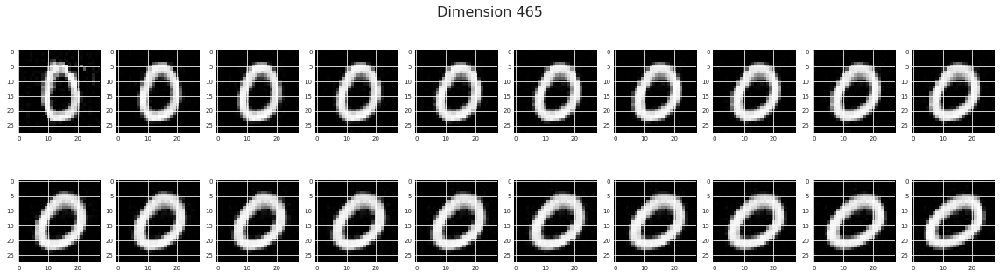

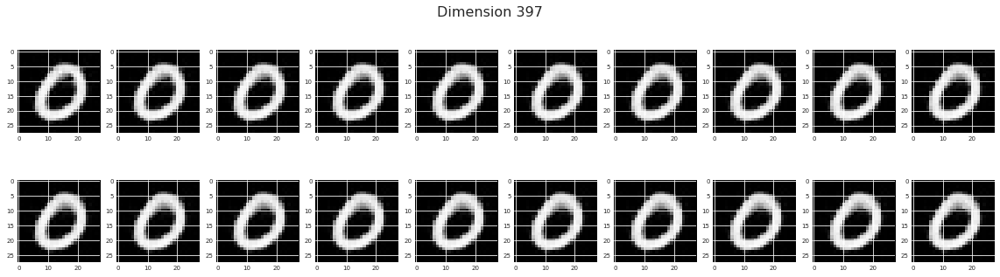

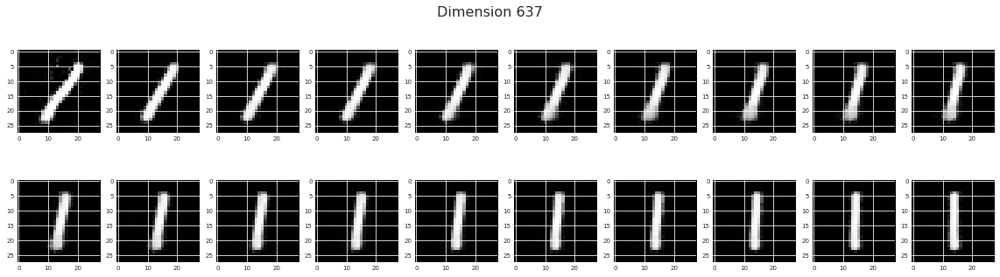

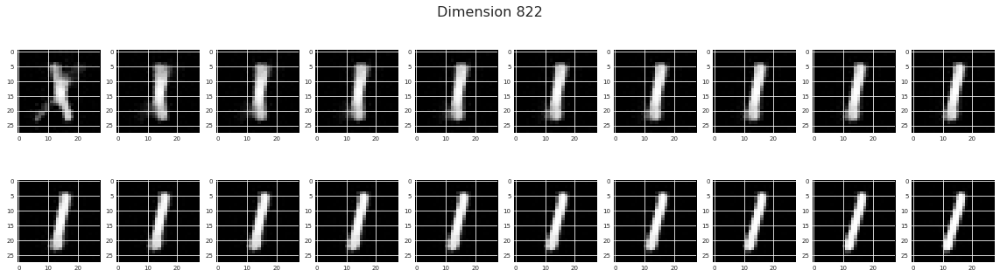

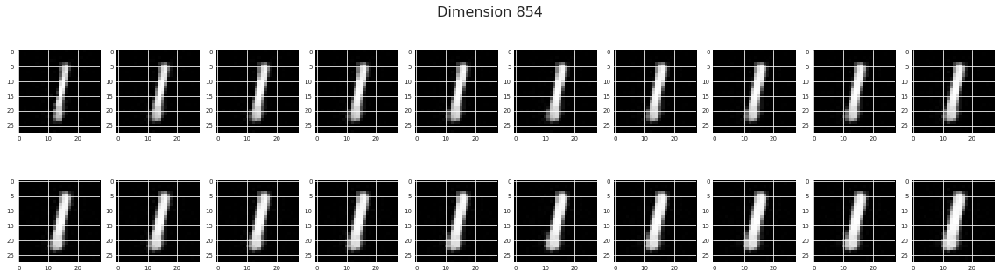

,total_loss
1210,1.369666


,total_loss
1220,1.278565


,total_loss
1230,1.237715


,total_loss
1240,1.182973


,total_loss
1250,1.137676


,total_loss
1260,1.099506


,total_loss
1270,1.058381


,total_loss
1280,1.081756


,total_loss
1290,1.031078


,total_loss
1300,1.01527


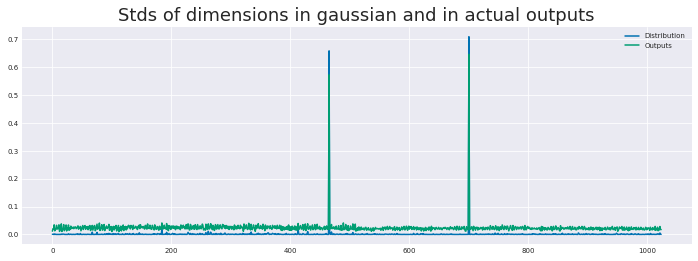

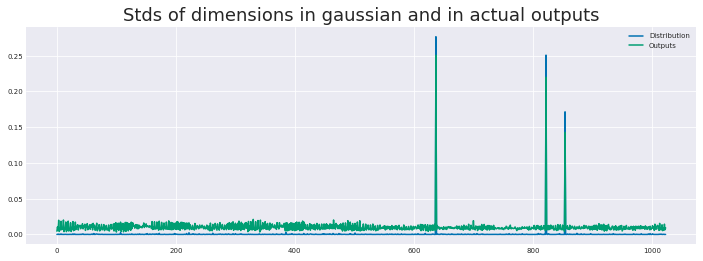

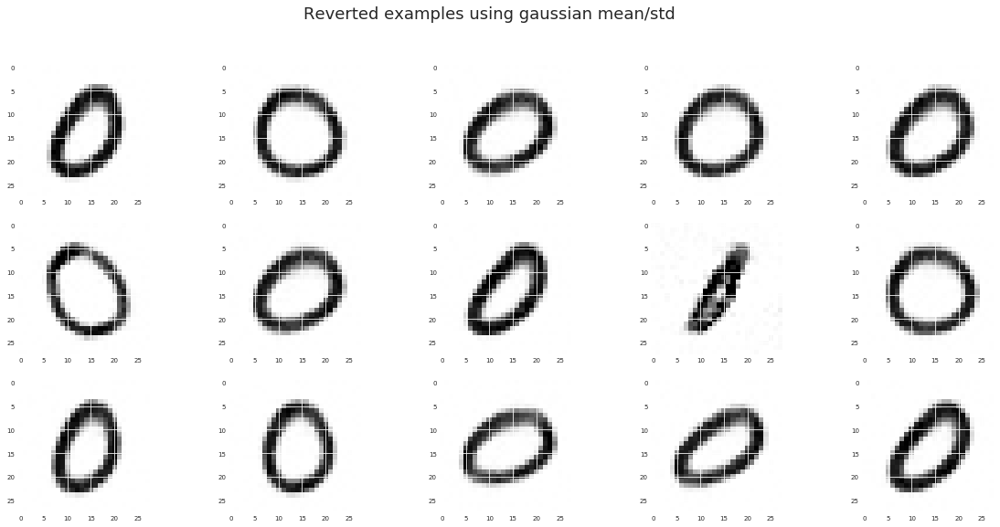

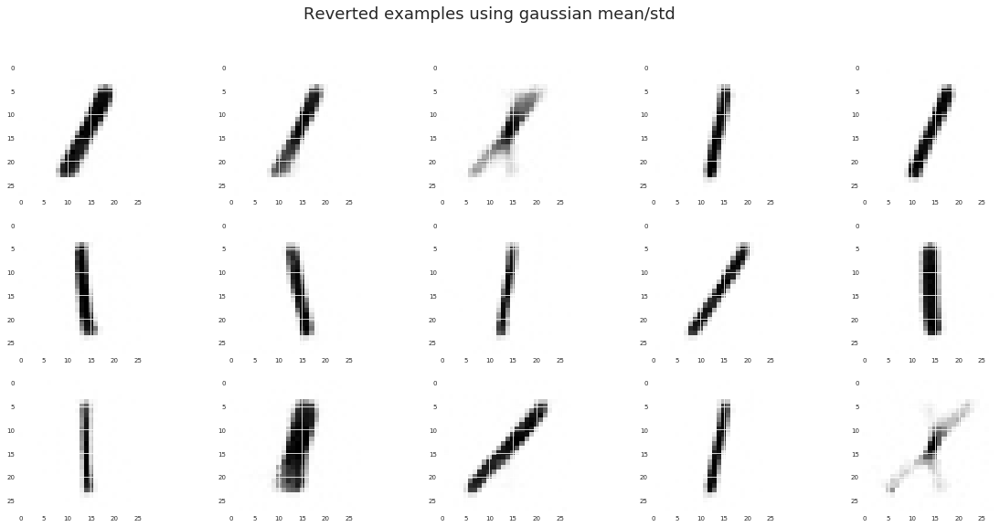

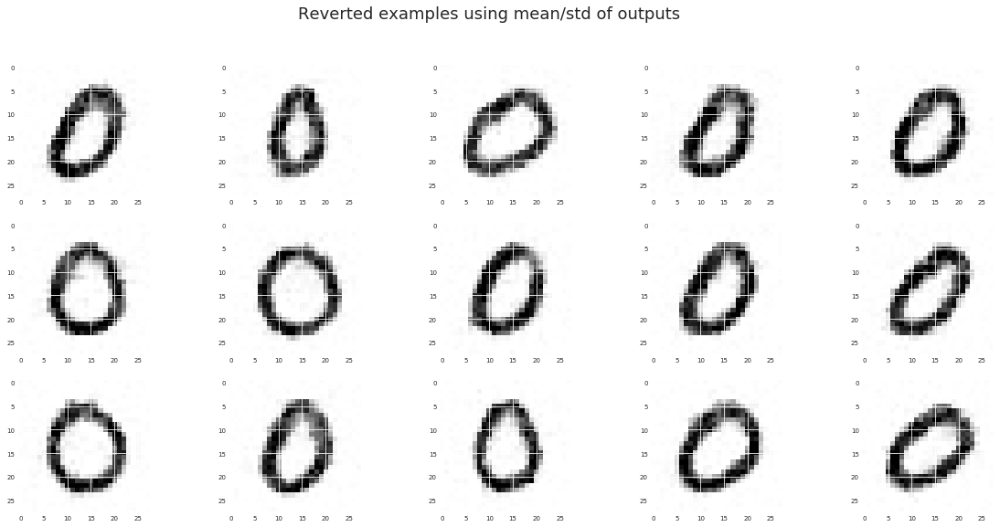

...

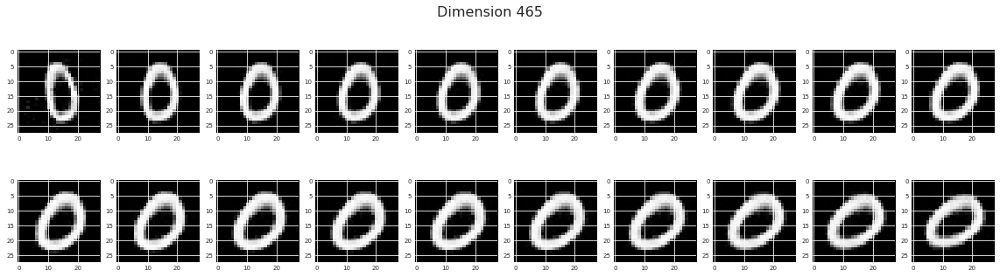

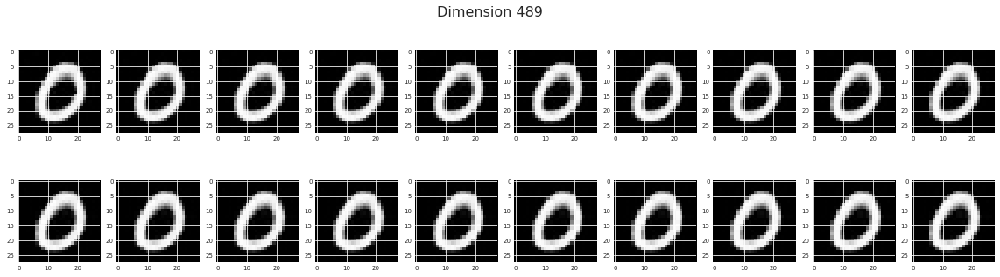

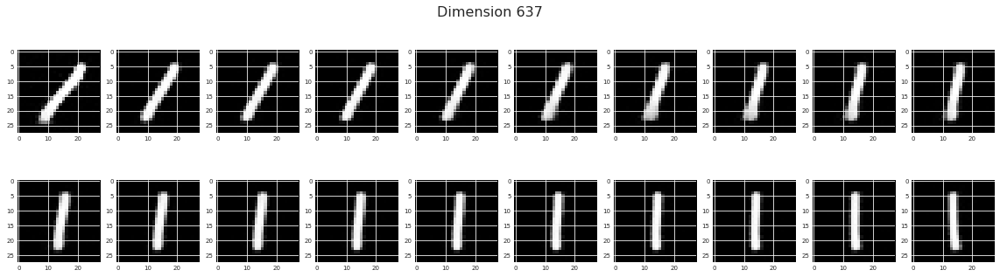

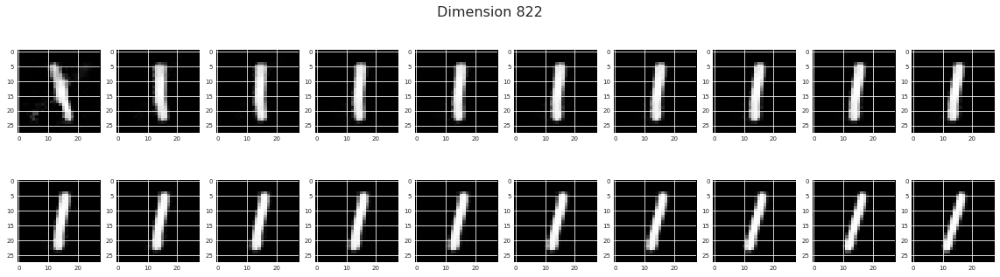

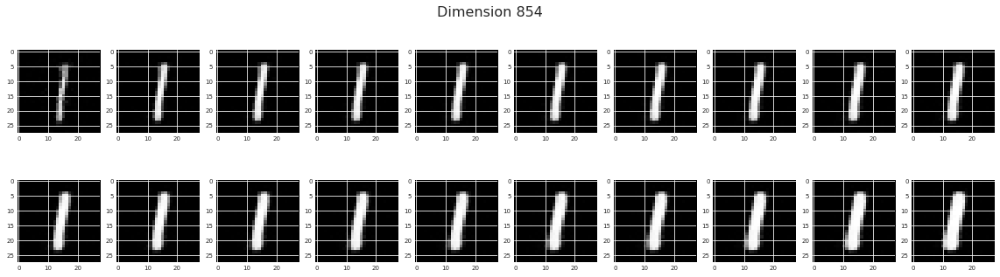

,total_loss
1310,0.985965


,total_loss
1320,0.982527


,total_loss
1330,0.962906


,total_loss
1340,0.957409


,total_loss
1350,0.946181


,total_loss
1360,0.942551


,total_loss
1370,0.923862


,total_loss
1380,0.943593


,total_loss
1390,0.92559


,total_loss
1400,0.908716


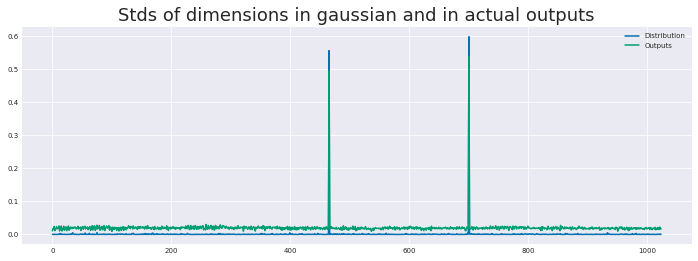

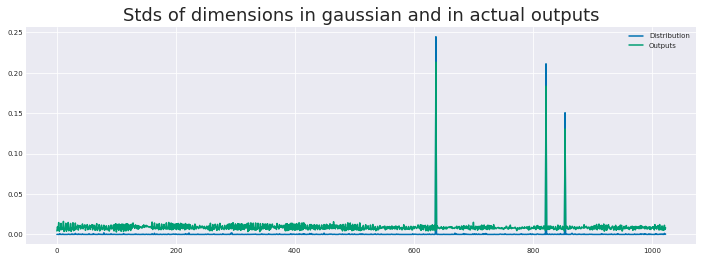

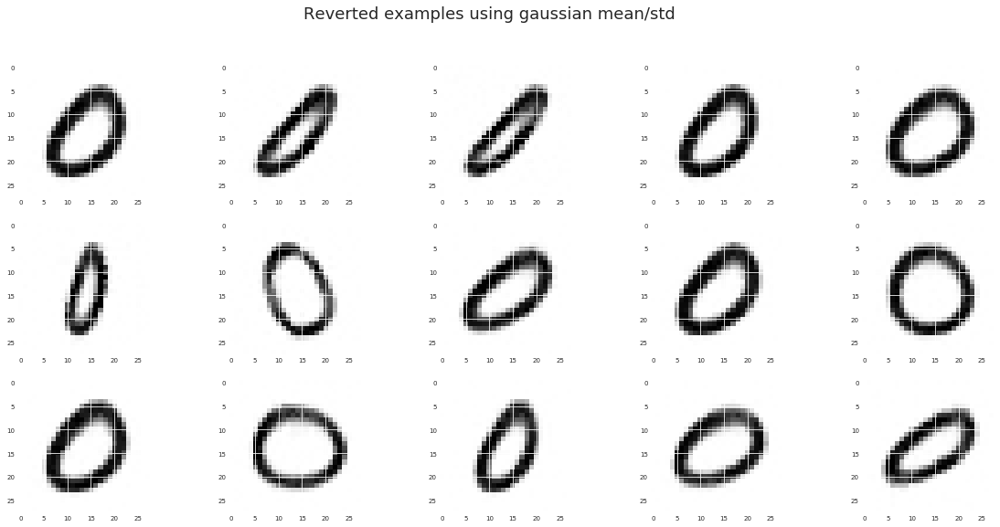

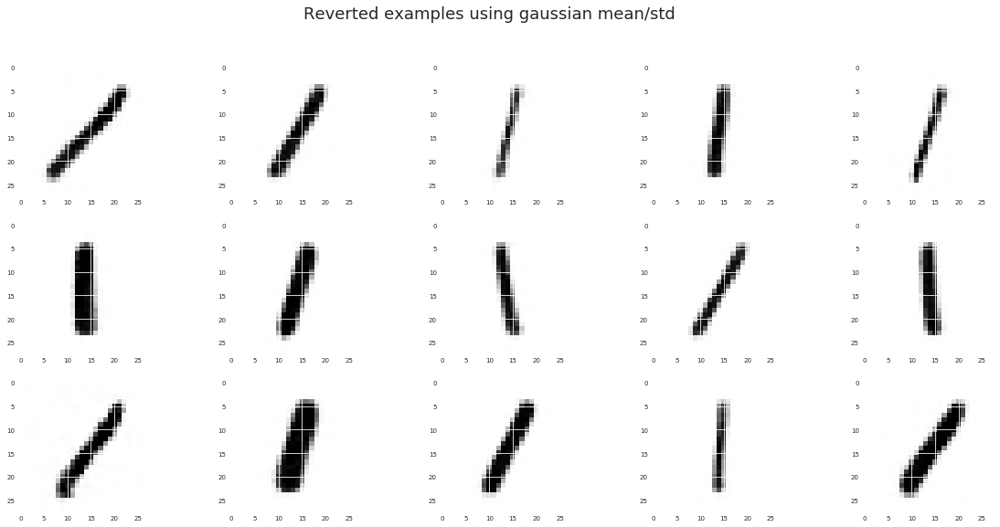

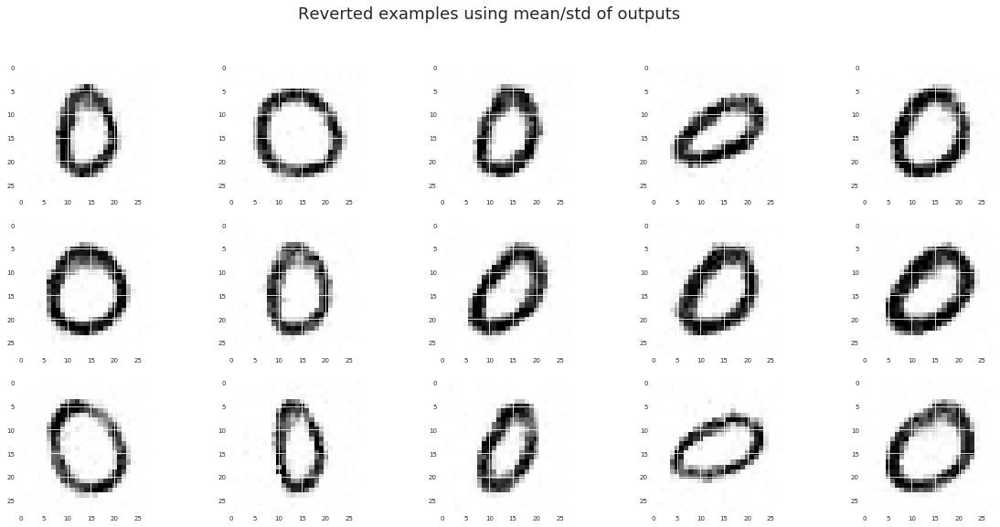

...

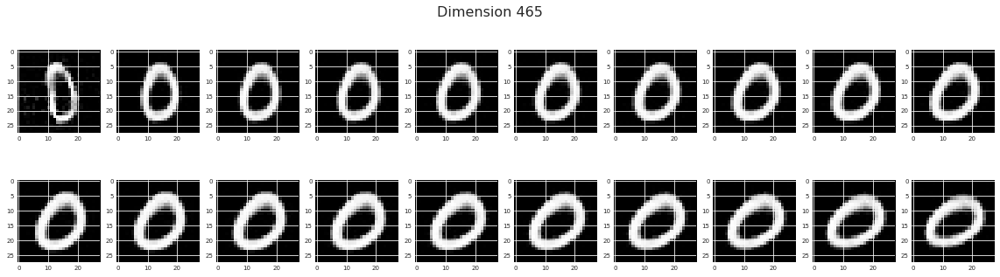

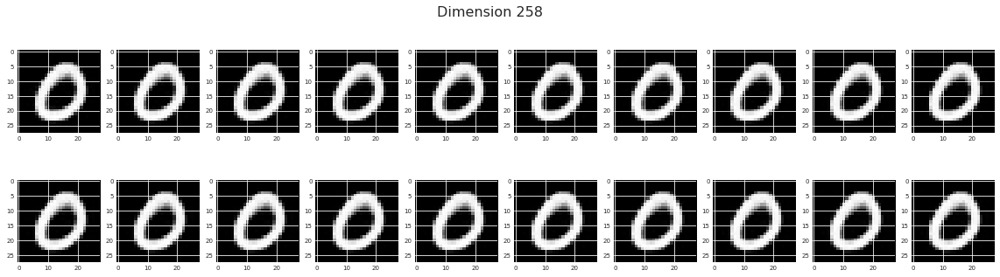

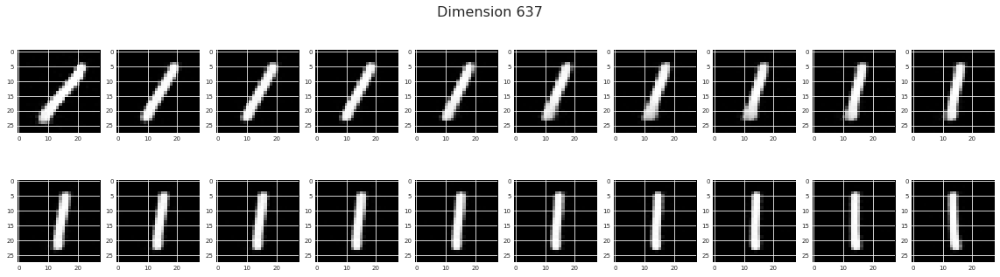

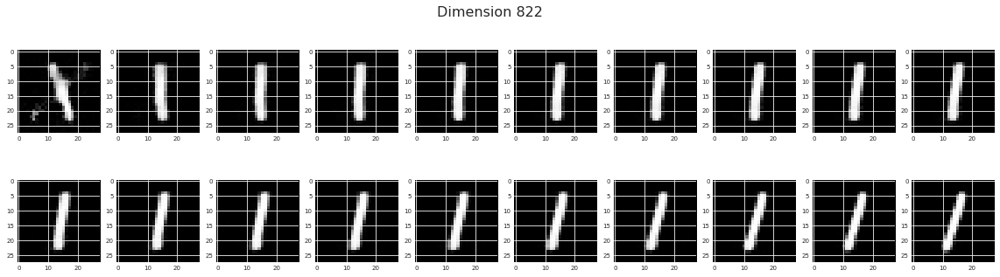

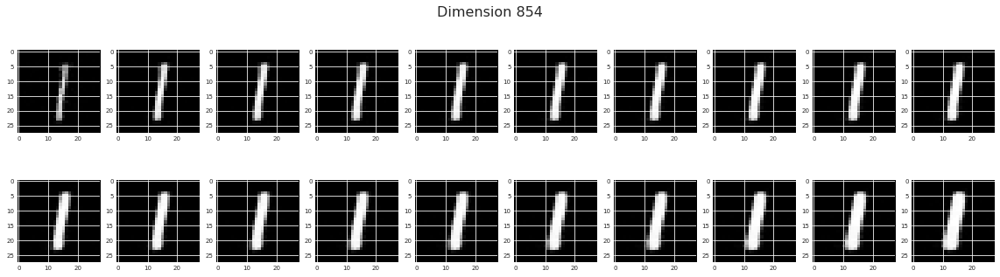

,total_loss
1410,0.9129


KeyboardInterrupt: 

In [14]:
import pandas as pd
from reversible.util import var_to_np
from reversible.revnet import get_inputs_from_reverted_samples

rng = RandomState(1)
epochs_dataframe = pd.DataFrame()
for i_epoch in range(100001):
    feature_model.train()
    for i_update in range(n_updates_per_epoch):
        if i_update % (n_critic_updates + 1) == n_critic_updates:
            # now run generator
            loss = train_one_batch(iterator, feature_model, loss_fn, means_per_dim, stds_per_dim, optimizer)
            stds_per_dim.data.clamp_(min=0)
        else:
            loss = train_one_batch(iterator, feature_model, loss_fn_adv, means_per_dim, stds_per_dim, optimizer_adv)
            stds_per_dim.data.clamp_(min=0) # should not be necessary...
    feature_model.eval()
    epochs_dataframe = epochs_dataframe.append({
        'total_loss': np.mean(loss),
    },
        ignore_index=True)
    if i_epoch % 10 == 0:
        display(epochs_dataframe.iloc[-1:])
    if i_epoch % 100 == 0:
        
        all_outs = feature_model(inputs)
        all_outs = var_to_np(all_outs).squeeze()
        
        for i_cluster in range(2):
            fig = plt.figure()
            plt.plot(var_to_np(stds_per_dim[i_cluster]))
            plt.plot(np.std(all_outs[y == i_cluster], axis=0))
            plt.legend(('Distribution', 'Outputs'))
            plt.title("Stds of dimensions in gaussian and in actual outputs", fontsize=18)
            display(fig)
            plt.close(fig)
        
        for i_cluster in range(2):
            rec_examples, _ = get_inputs_from_reverted_samples(
                 15, means_per_dim[i_cluster:i_cluster+1], stds_per_dim[i_cluster:i_cluster+1],
                np_to_var([1,]), feature_model,
                to_4d=False)

            fig, axes = plt.subplots(3,5, figsize=(20,9))

            for i_example, ax in enumerate(axes.flatten()):
                ax.imshow(rec_examples[i_example].squeeze(), vmin=0, vmax=1, cmap=cm.Greys)
            fig.suptitle("Reverted examples using gaussian mean/std", fontsize=18)
            display(fig)
            plt.close(fig)
        
        for i_cluster in range(len(means_per_dim)):
            mean =  np_to_var(np.mean(all_outs[y == i_cluster], axis=0, keepdims=True), dtype=np.float32).cuda()
            std = np_to_var(np.std(all_outs[y == i_cluster], axis=0, keepdims=True), dtype=np.float32).cuda()
            rec_examples, _ = get_inputs_from_reverted_samples(
                 15, mean, std,
                np_to_var([1,]), feature_model,
                to_4d=False)

            fig, axes = plt.subplots(3,5, figsize=(20,9))

            for i_example, ax in enumerate(axes.flatten()):
                ax.imshow(rec_examples[i_example].squeeze(), vmin=0, vmax=1, cmap=cm.Greys)
            fig.suptitle("Reverted examples using mean/std of outputs", fontsize=18)
            display(fig)
            plt.close(fig)
        
        for i_cluster in range(2):
            stds = np.std(all_outs[y == i_cluster], axis=0)
            sorted_stds = np.argsort(stds)[::-1]
            for i_large_std in sorted_stds[:3]:
                stds_cloned = stds_per_dim.clone()
                stds_cloned = stds_cloned * 0
                stds_cloned[i_cluster,i_large_std] = float(stds[i_large_std])
                rec_examples, gauss_samples = get_inputs_from_reverted_samples(
                    1000, means_per_dim[i_cluster:i_cluster+1],
                    stds_cloned[i_cluster:i_cluster+1], np_to_var([1]), feature_model, to_4d=False)
                i_sort = np.argsort(var_to_np(gauss_samples)[:, i_large_std])
                sorted_examples = rec_examples[i_sort]
                sorted_examples = sorted_examples[::1000//20]
                fig = plot_sorted_examples(sorted_examples)
                fig.suptitle("Dimension {:d}".format(i_large_std), fontsize=16)
                display(fig)
                plt.close(fig)

In [1]:
for i_cluster in range(len(means_per_dim)):
    stds = np.std(all_outs[y == i_cluster], axis=0)
    sorted_stds = np.argsort(stds)[::-1]
    feature_combinations = [sorted_stds[:2]]
    if i_cluster == 1:
        feature_combinations = [sorted_stds[:2], (sorted_stds[0], sorted_stds[2]),
                                (sorted_stds[1], sorted_stds[2])]
    for i_feature_a, i_feature_b in feature_combinations:
        mean = means_per_dim[i_cluster]
        std = stds_per_dim[i_cluster]

        feature_a_values = th.linspace(float(mean[i_feature_a].data - 2 * std[i_feature_a].data),
                                       float(mean[i_feature_a].data + 2 * std[i_feature_a].data), 8)
        feature_b_values = th.linspace(float(mean[i_feature_b].data - 2 * std[i_feature_b].data),
                                       float(mean[i_feature_b].data + 2 * std[i_feature_b].data), 8)

        image_grid = np.zeros((len(feature_a_values), len(feature_b_values), 28,28))

        for i_f_a_val, f_a_val in enumerate(feature_a_values):
            for i_f_b_val, f_b_val in enumerate(feature_b_values):
                this_out = mean.clone()
                this_out.data[i_feature_a] = f_a_val
                this_out.data[i_feature_b] = f_b_val
                inverted = var_to_np(invert(feature_model, this_out.unsqueeze(0))[0,0])

                image_grid[i_f_a_val, i_f_b_val] = np.copy(inverted)
        fig, axes = plt.subplots(len(feature_a_values), len(feature_b_values), figsize=(14,14))
        for i_f_a_val, _ in enumerate(feature_a_values):
            for i_f_b_val, _ in enumerate(feature_b_values):
                axes[i_f_a_val][i_f_b_val].imshow(image_grid[i_f_a_val, i_f_b_val], vmin=0, vmax=1,
                                                  cmap=cm.Greys)
                axes[i_f_a_val][i_f_b_val].axis('off')
        fig.suptitle("Feature {:d} and {:d}".format(i_feature_a, i_feature_b), fontsize=18, y=0.98)
        display(fig)
        plt.close(fig)


NameError: name 'means_per_dim' is not defined

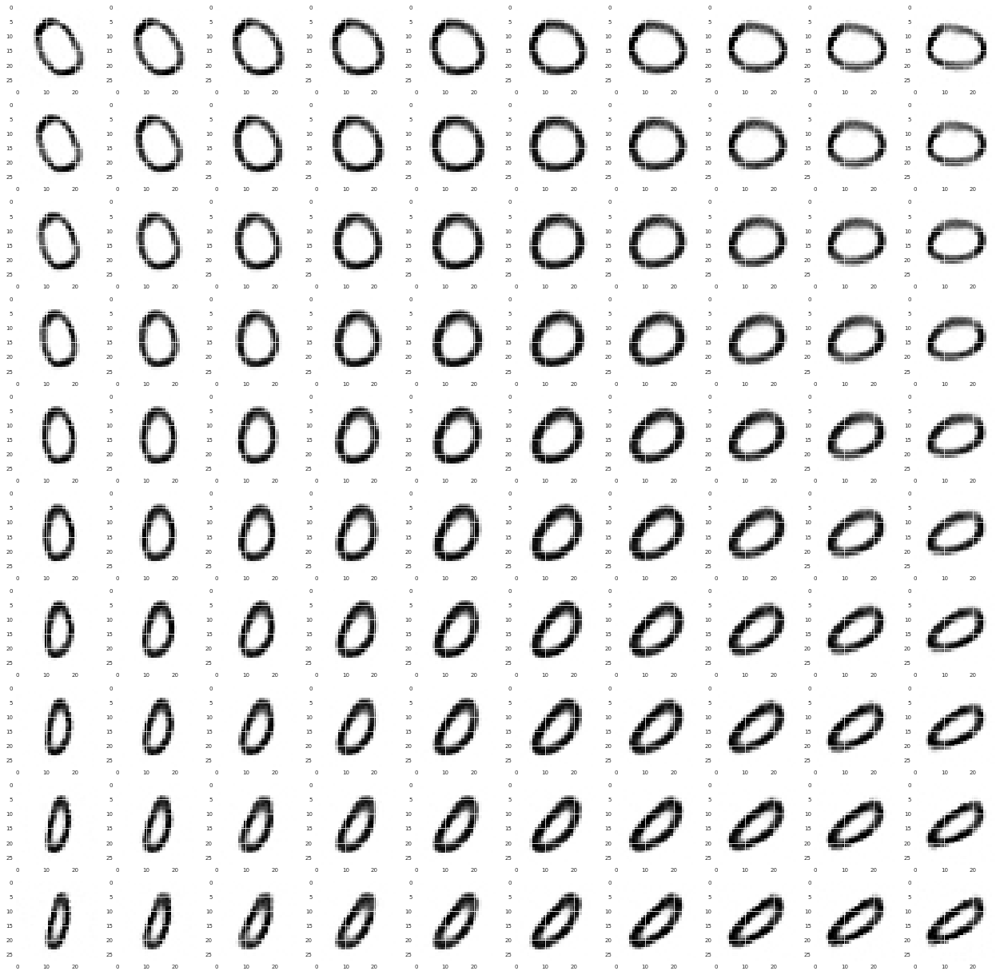